In [ ]:
import os
import glob
import warnings
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import seaborn as sns
import anndata as ad
import matplotlib.pyplot as plt
from scipy.stats import median_abs_deviation
from sklearn.manifold import SpectralEmbedding


warnings.simplefilter('ignore', FutureWarning)
warnings.simplefilter('ignore', UserWarning)
warnings.simplefilter('ignore', RuntimeWarning)

plt.rcParams['pdf.fonttype'] = 42

In this script we are going to: <br> A) Run InferCNV <br> B) Cluster the Tumour only cells (with initial DEG analysis, later we use Deseq for more power) <br>C) Also this will be used for extracting barcodes from either normal or tumour cells per timepoint

In [2]:
import infercnvpy

ERROR: Error in parse(text = input): <text>:1:8: unexpected symbol
1: import infercnvpy
           ^


In [ ]:
#This comes after the first exploration/annotation of the data. The H5ad data needs to annotated already
multiome = sc.read_h5ad("/path/to/h5ad")

ERROR: Error in sc.read_h5ad("/path/to/h5ad"): could not find function "sc.read_h5ad"


In [ ]:
multiome.obs

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_1.25,leiden_1.5,leiden_2.0,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine
AAACAGCCAGTTTGTG-D0,D0,8056.0,1891,7.545390,7641.0,8.941415,21.823060,13.584609,7.642979,0.0,...,4,4,4,1,9,37,B-cell lineage,0.978114,Pro-B cells,0.950723
AAACAGCCATGTTTGG-D0,D0,23901.0,2319,7.749322,10986.0,9.304468,21.354451,13.899508,9.111597,0.0,...,8,8,7,13,63,36,B-cell lineage,0.603815,Pro-B cells,0.370262
AAACAGCCATTTAAGC-D0,D0,31317.0,1667,7.419381,6636.0,8.800415,21.503918,13.803495,6.268836,0.0,...,4,4,4,1,26,134,B-cell lineage,0.951335,Pro-B cells,0.903238
AAACATGCATTGGGAG-D0,D0,1039.0,1599,7.377759,6888.0,8.837681,24.811266,18.626598,5.894309,0.0,...,4,4,4,10,19,81,B-cell lineage,0.121671,Pro-B cells,0.183371
AAACCAACAATAACCT-D0,D0,25718.0,1403,7.247081,5495.0,8.611775,24.913558,18.817106,5.150136,0.0,...,4,4,4,10,8,46,B-cell lineage,0.991872,Pro-B cells,0.996793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGAAGCATGAAG-Q3,Q3,13995.0,2061,7.631432,8523.0,9.050641,21.858501,14.009152,6.112871,0.0,...,5,7,18,38,30,9,B-cell lineage,0.930010,Pro-B cells,0.984357
TTTGTGAAGCGAGTAA-Q3,Q3,34490.0,1361,7.216709,5059.0,8.529121,23.739870,17.019173,8.381103,0.0,...,10,11,8,23,14,5,B-cell lineage,0.403587,Pro-B cells,0.973642
TTTGTGGCAGCCTGCA-Q3,Q3,3673.0,1536,7.337588,6272.0,8.744010,29.432398,23.852041,6.505102,0.0,...,1,0,0,16,22,58,B-cell lineage,0.484664,Pro-B cells,0.177973
TTTGTTGGTAAACAAG-Q3,Q3,9679.0,1279,7.154615,5301.0,8.575839,35.653650,28.730429,2.886248,0.0,...,9,10,11,45,50,31,Monocytes,0.745200,Non-classical monocytes,0.041574


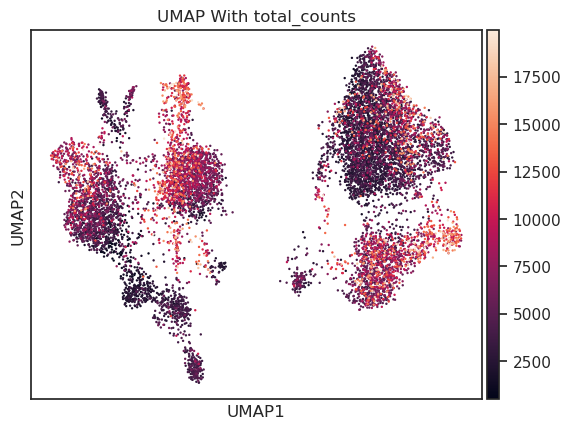

In [ ]:
sc.pl.umap(multiome, color="total_counts", title="UMAP With total_counts")

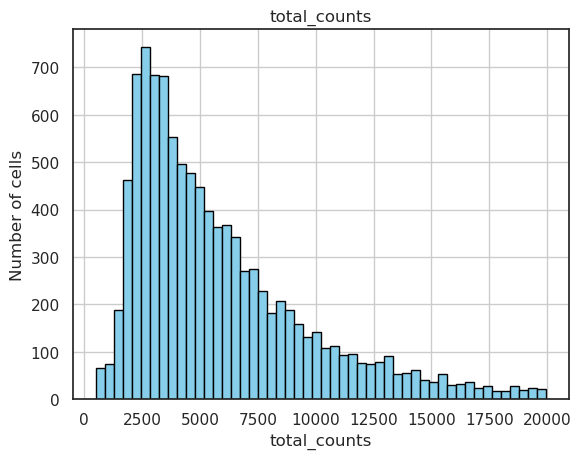

In [ ]:
log_ratios = multiome.obs["total_counts"]
log_ratios_clean = log_ratios.replace([np.inf, -np.inf], np.nan).dropna()

# Plot the histogram
plt.hist(log_ratios_clean, bins=50, color='skyblue', edgecolor='black')
plt.xlabel("total_counts")
plt.ylabel("Number of cells")
plt.title("total_counts")
plt.grid(True)
plt.show()

In [3]:
#Doublet RNA filtering:
multiome = multiome[multiome.obs['total_counts'] < 20000, :]

ERROR: Error in parse(text = input): <text>:2:59: unexpected ':'
1: #Doublet RNA filtering:
2: multiome = multiome[multiome.obs['total_counts'] < 20000, :
                                                             ^


In [ ]:
multiome.var

,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
SCYL3,False,False,False,637,0.104850,0.099710,94.654695,1249.5,7.131299,False,0.057209,0.775965,0.012695,0,False
C1orf112,False,False,False,541,0.081187,0.078059,95.460267,967.5,6.875749,False,0.043015,0.741774,-0.172172,0,False
FGR,False,False,False,385,0.073005,0.070463,96.769321,870.0,6.769642,True,0.059463,1.020881,0.753578,2,False
CFH,False,False,False,17,0.002182,0.002179,99.857347,26.0,3.295837,False,0.001599,0.447655,-0.738155,0,False
STPG1,False,False,False,145,0.022489,0.022240,98.783251,268.0,5.594711,True,0.013725,0.865135,0.428342,2,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC136616.3,False,False,False,0,0.000000,0.000000,100.000000,0.0,0.000000,False,0.000000,0.000000,0.000000,0,False
AC023491.2,False,False,False,0,0.000000,0.000000,100.000000,0.0,0.000000,False,0.000000,0.000000,0.000000,0,False
AC007325.1,False,False,False,0,0.000000,0.000000,100.000000,0.0,0.000000,False,0.000000,0.000000,0.000000,0,False
AC007325.2,False,False,False,0,0.000000,0.000000,100.000000,0.0,0.000000,False,0.000000,0.000000,0.000000,0,False


In [ ]:
gtf = pd.read_csv(
    "gencode.v43.basic.annotation.gtf",
    sep="\t",
    comment="#",
    header=None,
    names=["chrom", "source", "feature", "start", "end", "score", "strand", "frame", "attribute"]
)



In [ ]:
gtf_genes = gtf[gtf["feature"] == "gene"]
gtf_genes.head

<bound method NDFrame.head of         chrom   source feature  start    end score strand frame  \
0        chr1   HAVANA    gene  11869  14409     .      +     .   
5        chr1   HAVANA    gene  12010  13670     .      +     .   
13       chr1   HAVANA    gene  14404  29570     .      -     .   
26       chr1  ENSEMBL    gene  17369  17436     .      -     .   
29       chr1   HAVANA    gene  29554  31109     .      +     .   
...       ...      ...     ...    ...    ...   ...    ...   ...   
1998561  chrM  ENSEMBL    gene  14149  14673     .      -     .   
1998566  chrM  ENSEMBL    gene  14674  14742     .      -     .   
1998569  chrM  ENSEMBL    gene  14747  15887     .      +     .   
1998574  chrM  ENSEMBL    gene  15888  15953     .      +     .   
1998577  chrM  ENSEMBL    gene  15956  16023     .      -     .   

                                                 attribute  
0        gene_id "ENSG00000290825.1"; gene_type "lncRNA...  
5        gene_id "ENSG00000223972.6"; gene_

In [ ]:
import re
# Step 2: Extract gene_name from attribute string using regex
def extract_gene_name(attr):
    match = re.search('gene_name "([^"]+)"', attr)
    return match.group(1) if match else None

gtf_genes["gene_name"] = gtf_genes["attribute"].apply(extract_gene_name)

# Step 3: Build clean coordinate DataFrame
gtf_clean = gtf_genes[["gene_name", "chrom", "start", "end"]].dropna()
gtf_clean = gtf_clean.drop_duplicates("gene_name")
gtf_clean = gtf_clean.set_index("gene_name")
gtf_clean.columns = ["chromosome", "start", "end"]

# Optional: remove 'chr' prefix to match AnnData (if needed)
gtf_clean["chromosome"] = gtf_clean["chromosome"].str.replace("^chr", "", regex=True)

# Step 4: Annotate your AnnData object
genes_matched = multiome.var_names.intersection(gtf_clean.index)

multiome.var["chromosome"] = gtf_clean.loc[genes_matched, "chromosome"]
multiome.var["start"] = gtf_clean.loc[genes_matched, "start"]
multiome.var["end"] = gtf_clean.loc[genes_matched, "end"]

/tmp/ipykernel_1178798/803066405.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gtf_genes["gene_name"] = gtf_genes["attribute"].apply(extract_gene_name)


In [ ]:
multiome.var["chromosome"] = "chr" + multiome.var["chromosome"].astype(str)

In [ ]:
multiome.var["chromosome"].unique

<bound method Series.unique of SCYL3           chr1
C1orf112        chr1
FGR             chr1
CFH             chr1
STPG1           chr1
               ...  
AC136616.3    chrnan
AC023491.2    chrnan
AC007325.1    chrnan
AC007325.2    chrnan
AC007325.4    chrnan
Name: chromosome, Length: 36601, dtype: object>

In [ ]:
multiome.var[['chromosome', 'start']].dropna().shape


(23467, 2)

In [ ]:
# Filter out genes annotated with 'chrnan'
valid_genes = multiome.var['chromosome'] != 'chrnan'
multiome_filtered = multiome[:, valid_genes]

In [ ]:
multiome_filtered.obs["celltypist_cell_label_fine"].unique()

['Pro-B cells', 'Naive B cells', 'CD16+ NK cells', 'Tcm/Naive helper T cells', 'Classical monocytes', 'Tem/Trm cytotoxic T cells', 'Non-classical monocytes']
Categories (7, object): ['CD16+ NK cells', 'Classical monocytes', 'Naive B cells', 'Non-classical monocytes', 'Pro-B cells', 'Tcm/Naive helper T cells', 'Tem/Trm cytotoxic T cells']

In [ ]:
infercnvpy.tl.infercnv(adata=multiome_filtered, reference_key= "celltypist_cell_label_fine", reference_cat= ['Naive B cells', 'CD16+ NK cells', 'Tcm/Naive helper T cells', 'Classical monocytes', 'Tem/Trm cytotoxic T cells', 'Non-classical monocytes'],window_size=200)

  0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
os.chdir("/output_figures")

In [ ]:
# Create 'deep_annotation' with the correct logic
multiome_filtered.obs["deep_annotation"] = multiome_filtered.obs["celltypist_cell_label_fine"].astype(str)

# Apply the condition:
# If cell is "Pro-B cell", use sample name; else "normal"
multiome_filtered.obs["deep_annotation"] = np.where(
    multiome_filtered.obs["celltypist_cell_label_fine"] == "Pro-B cells",
    multiome_filtered.obs["sample"],
    "Normal_cells"
)

In [ ]:
custom_colors = {
    "Normal_cells": "#CCCCCC",
    "D0": "#fac710",
    "Q1": "#709AE1FF",
    "Q2": "#8f18c7",
    "Q3": "#977140"
}

In [ ]:
# Define the desired order
desired_order = ["D0", "Q1", "Q2", "Q3", "Normal_cells"]  # replace with actual sample names

# Convert to ordered categorical
multiome_filtered.obs["deep_annotation"] = pd.Categorical(
    multiome_filtered.obs["deep_annotation"],
    categories=desired_order,
    ordered=True
)

In [ ]:
multiome_filtered.uns["deep_annotation_colors"] = [custom_colors[cat] for cat in desired_order]

In [ ]:
# Register the palette
multiome_filtered.uns["deep_annotation_colors"] = [custom_colors[cat] for cat in desired_order]

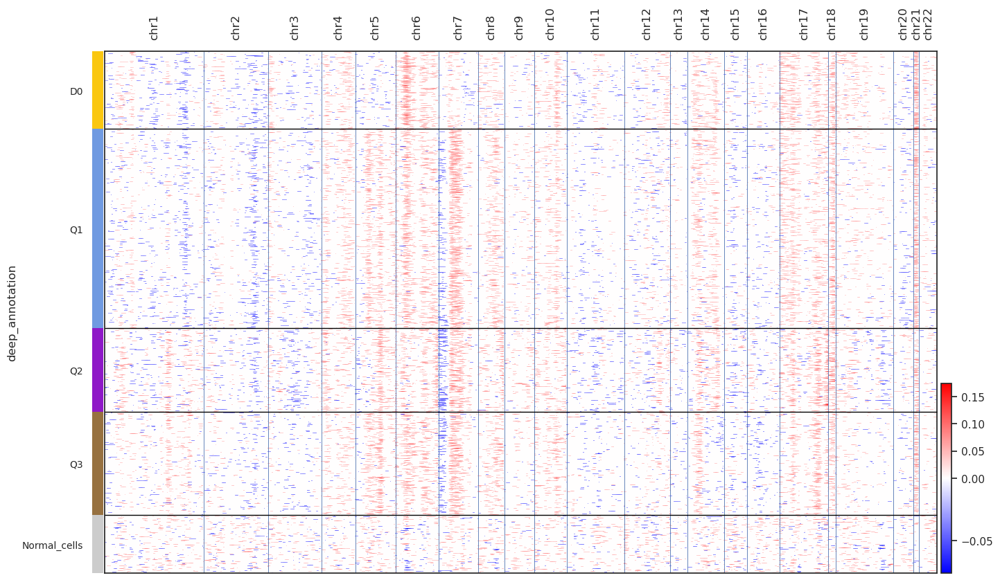

In [ ]:
infercnvpy.pl.chromosome_heatmap(multiome_filtered, groupby="deep_annotation", save = "InferCNV_all_celltypes_with_tumour_timepoints.pdf")

In [ ]:
!pwd

/lustre1/project/stg_00096/home/projects/2023_Cools_B-ALL/RNA-analysis/final_analysis/output_figures


In [ ]:
#Clustering by CNV profiles and identifying tumor cells
infercnvpy.tl.pca(multiome_filtered)
infercnvpy.pp.neighbors(multiome_filtered)
infercnvpy.tl.leiden(multiome_filtered)


categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


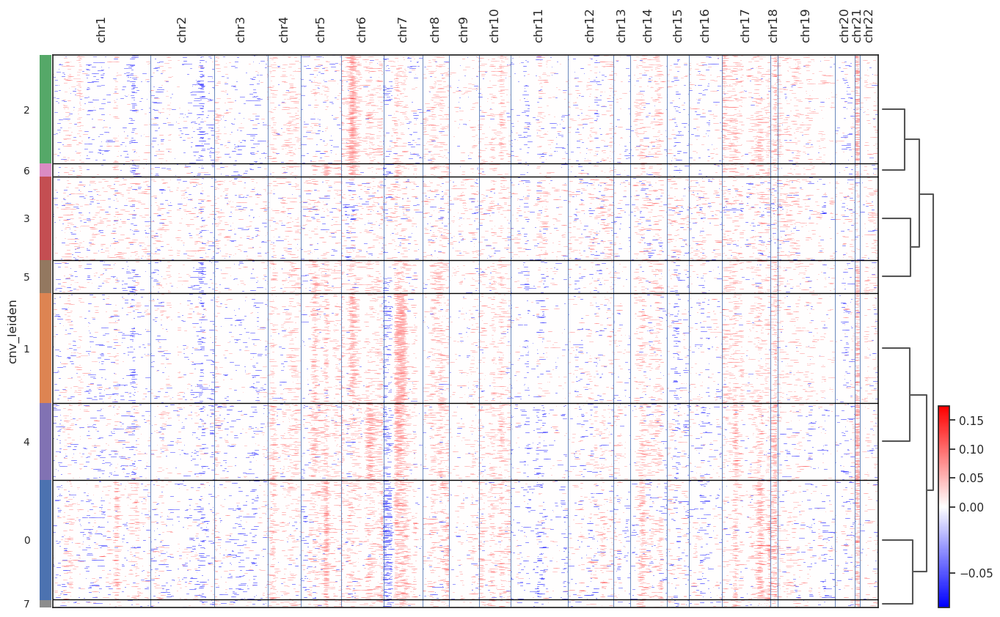

In [ ]:
infercnvpy.pl.chromosome_heatmap(multiome_filtered, groupby="cnv_leiden", dendrogram=True, save ="InferCNV_all_celtypes_recluster.pdf")

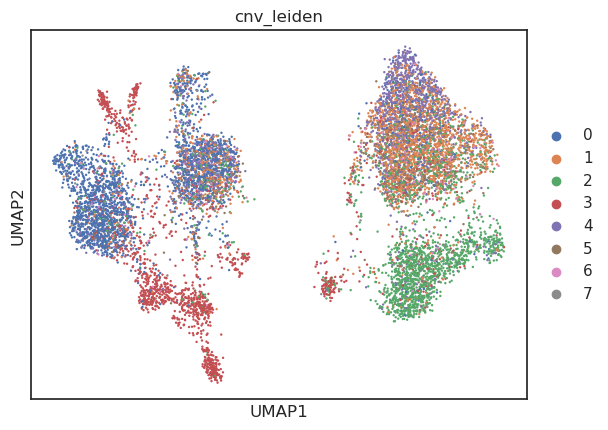

In [ ]:
sc.tl.umap(multiome_filtered)  # First, make sure UMAP is computed
sc.pl.umap(multiome_filtered, color=["cnv_leiden"], save ="InferCNV_all_celtypes_recluster_back_onUMPAP.pdf")


In [ ]:
infercnvpy.tl.cnv_score(multiome_filtered)

In [ ]:
infercnvpy.tl.umap(multiome_filtered)

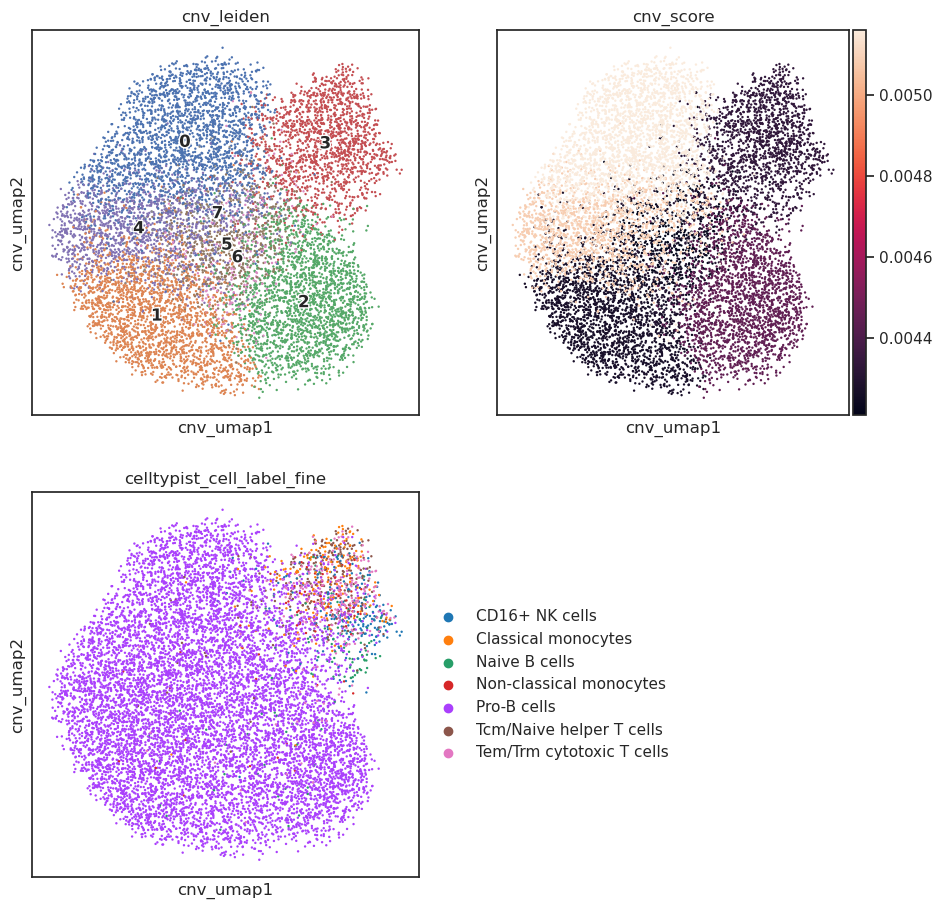

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
infercnvpy.pl.umap(
    multiome_filtered,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
infercnvpy.pl.umap(multiome_filtered, color="cnv_score", ax=ax2, show=False)
infercnvpy.pl.umap(multiome_filtered, color="celltypist_cell_label_fine", ax=ax3)


<Axes: title={'center': 'sample'}, xlabel='cnv_umap1', ylabel='cnv_umap2'>

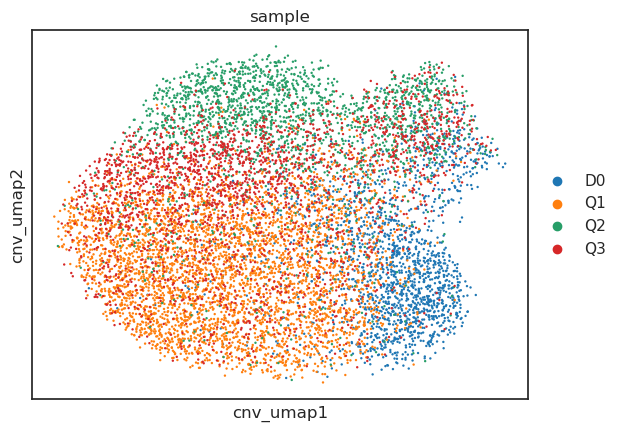

In [ ]:
infercnvpy.pl.umap(multiome_filtered, color="sample", show=False)

In [ ]:
multiome_filtered.obs

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio,deep_annotation,cnv_leiden,cnv_score
AAACAGCCAGTTTGTG-D0,D0,8056.0,1891,7.545390,7641.0,8.941415,21.823060,13.584609,7.642979,0.0,...,9,37,B-cell lineage,0.978114,Pro-B cells,0.950723,no,D0,2,0.004449
AAACAGCCATGTTTGG-D0,D0,23901.0,2319,7.749322,10986.0,9.304468,21.354451,13.899508,9.111597,0.0,...,63,36,B-cell lineage,0.603815,Pro-B cells,0.370262,no,D0,2,0.004449
AAACAGCCATTTAAGC-D0,D0,31317.0,1667,7.419381,6636.0,8.800415,21.503918,13.803495,6.268836,0.0,...,26,134,B-cell lineage,0.951335,Pro-B cells,0.903238,no,D0,5,0.004210
AAACATGCATTGGGAG-D0,D0,1039.0,1599,7.377759,6888.0,8.837681,24.811266,18.626598,5.894309,0.0,...,19,81,B-cell lineage,0.121671,Pro-B cells,0.183371,no,D0,2,0.004449
AAACCAACAATAACCT-D0,D0,25718.0,1403,7.247081,5495.0,8.611775,24.913558,18.817106,5.150136,0.0,...,8,46,B-cell lineage,0.991872,Pro-B cells,0.996793,no,D0,2,0.004449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGAAGCATGAAG-Q3,Q3,13995.0,2061,7.631432,8523.0,9.050641,21.858501,14.009152,6.112871,0.0,...,30,9,B-cell lineage,0.930010,Pro-B cells,0.984357,no,Q3,4,0.005083
TTTGTGAAGCGAGTAA-Q3,Q3,34490.0,1361,7.216709,5059.0,8.529121,23.739870,17.019173,8.381103,0.0,...,14,5,B-cell lineage,0.403587,Pro-B cells,0.973642,no,Q3,4,0.005083
TTTGTGGCAGCCTGCA-Q3,Q3,3673.0,1536,7.337588,6272.0,8.744010,29.432398,23.852041,6.505102,0.0,...,22,58,B-cell lineage,0.484664,Pro-B cells,0.177973,no,Q3,4,0.005083
TTTGTTGGTAAACAAG-Q3,Q3,9679.0,1279,7.154615,5301.0,8.575839,35.653650,28.730429,2.886248,0.0,...,50,31,Monocytes,0.745200,Non-classical monocytes,0.041574,no,Normal_cells,3,0.004329


In [ ]:
#Let's do this for the Tumour ony cells
Tumour_only = multiome[multiome.obs['celltypist_cell_label_fine'] == 'Pro-B cells', :]

In [ ]:
# Step 4: Annotate your AnnData object
genes_matched = multiome.var_names.intersection(gtf_clean.index)

Tumour_only.var["chromosome"] = gtf_clean.loc[genes_matched, "chromosome"]
Tumour_only.var["start"] = gtf_clean.loc[genes_matched, "start"]
Tumour_only.var["end"] = gtf_clean.loc[genes_matched, "end"]

In [ ]:
Tumour_only.var["chromosome"] = "chr" + Tumour_only.var["chromosome"].astype(str)

In [ ]:
# Filter out genes annotated with 'chrnan'
valid_genes = Tumour_only.var['chromosome'] != 'chrnan'
Tumour_filtered = Tumour_only[:, valid_genes]

In [ ]:
infercnvpy.tl.infercnv(adata=Tumour_filtered,window_size=200 )

  0%|          | 0/2 [00:00<?, ?it/s]

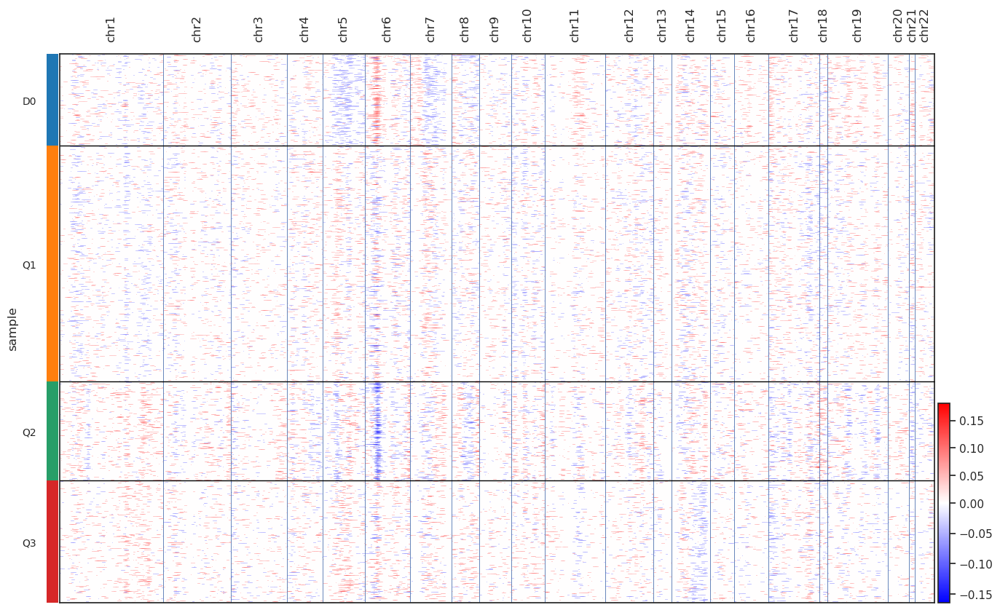

In [ ]:
#Now do for tumour only:
infercnvpy.pl.chromosome_heatmap(Tumour_filtered, groupby="sample", save = "InferCNV_Tumour_only.pdf")

In [ ]:
#Clustering by CNV profiles and identifying tumor cells
infercnvpy.tl.pca(Tumour_filtered)
infercnvpy.pp.neighbors(Tumour_filtered)
infercnvpy.tl.leiden(Tumour_filtered)

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


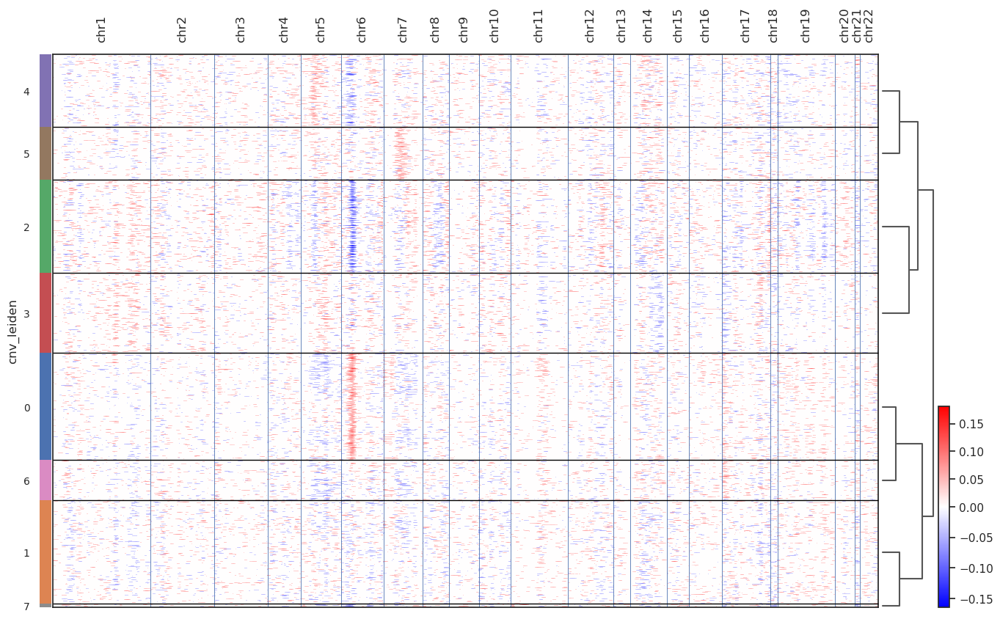

In [ ]:
infercnvpy.pl.chromosome_heatmap(Tumour_filtered, groupby="cnv_leiden", dendrogram=True)

In [ ]:
infercnvpy.tl.cnv_score(Tumour_filtered)
infercnvpy.tl.umap(Tumour_filtered)

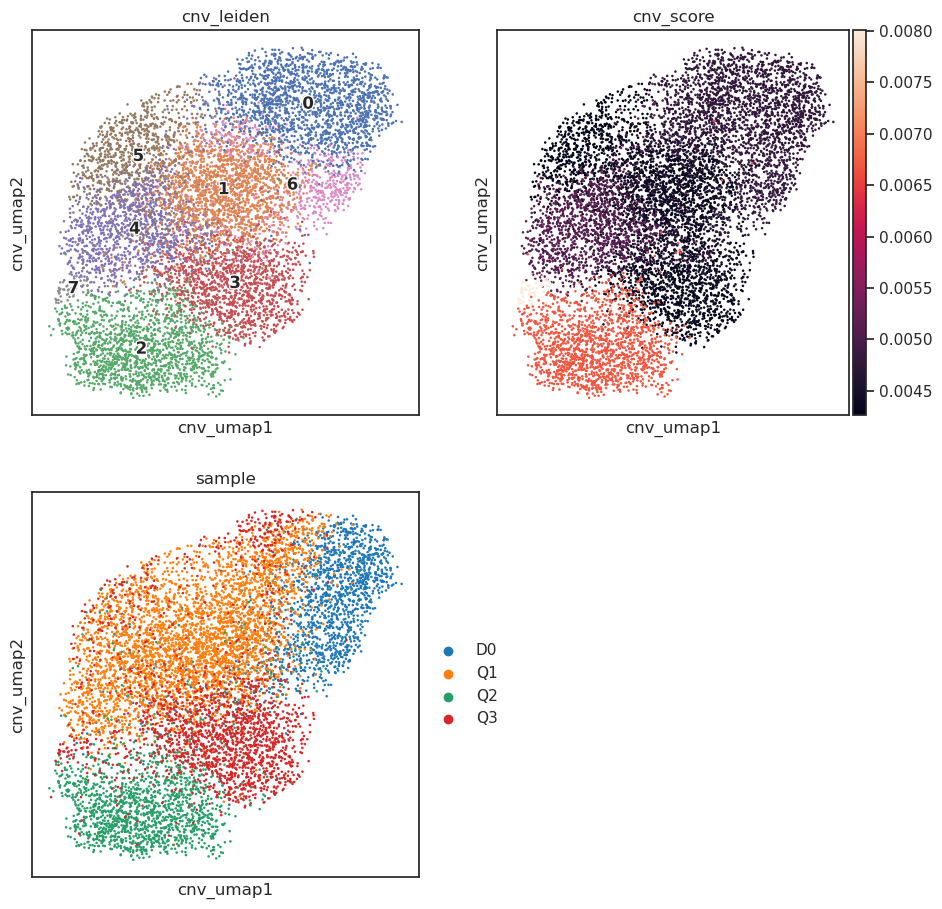

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
infercnvpy.pl.umap(
    Tumour_filtered,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
infercnvpy.pl.umap(Tumour_filtered, color="cnv_score", ax=ax2, show=False)
infercnvpy.pl.umap(Tumour_filtered, color="sample", ax=ax3)

In [ ]:
Tumour_filtered.obs

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio,cnv_leiden,cnv_score
AAACAGCCAGTTTGTG-D0,D0,8056.0,1891,7.545390,7641.0,8.941415,21.823060,13.584609,7.642979,0.0,...,1,9,37,B-cell lineage,0.978114,Pro-B cells,0.950723,no,6,0.004801
AAACAGCCATGTTTGG-D0,D0,23901.0,2319,7.749322,10986.0,9.304468,21.354451,13.899508,9.111597,0.0,...,13,63,36,B-cell lineage,0.603815,Pro-B cells,0.370262,no,0,0.004740
AAACAGCCATTTAAGC-D0,D0,31317.0,1667,7.419381,6636.0,8.800415,21.503918,13.803495,6.268836,0.0,...,1,26,134,B-cell lineage,0.951335,Pro-B cells,0.903238,no,1,0.004388
AAACATGCATTGGGAG-D0,D0,1039.0,1599,7.377759,6888.0,8.837681,24.811266,18.626598,5.894309,0.0,...,10,19,81,B-cell lineage,0.121671,Pro-B cells,0.183371,no,0,0.004740
AAACCAACAATAACCT-D0,D0,25718.0,1403,7.247081,5495.0,8.611775,24.913558,18.817106,5.150136,0.0,...,10,8,46,B-cell lineage,0.991872,Pro-B cells,0.996793,no,0,0.004740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGCTGTTGTAACG-Q3,Q3,3204.0,1982,7.592366,7513.0,8.924523,19.379742,10.941035,7.120990,0.0,...,11,68,272,B-cell lineage,0.947076,Pro-B cells,0.991950,no,3,0.004357
TTTGTGAAGCATGAAG-Q3,Q3,13995.0,2061,7.631432,8523.0,9.050641,21.858501,14.009152,6.112871,0.0,...,38,30,9,B-cell lineage,0.930010,Pro-B cells,0.984357,no,1,0.004388
TTTGTGAAGCGAGTAA-Q3,Q3,34490.0,1361,7.216709,5059.0,8.529121,23.739870,17.019173,8.381103,0.0,...,23,14,5,B-cell lineage,0.403587,Pro-B cells,0.973642,no,3,0.004357
TTTGTGGCAGCCTGCA-Q3,Q3,3673.0,1536,7.337588,6272.0,8.744010,29.432398,23.852041,6.505102,0.0,...,16,22,58,B-cell lineage,0.484664,Pro-B cells,0.177973,no,5,0.004262


# Tumour only transcriptome clustering

In [ ]:
#Recluster the tumour-only data of the four timepoints:
Tumour_only.X = Tumour_only.layers["counts"].copy()

In [ ]:
Tumour_only.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [2., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

# Have a look at the data and restart from the RAW counts

In [ ]:
dense_matrix = Tumour_only.X[:10, :10]
print(dense_matrix)



[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 7. 0. 0.]
 [0. 0. 0. 0. 0. 0. 3. 0. 0. 0.]]


In [ ]:
#This data looks already Normalised (Marios must have stored the rawcounts somewhere else)

In [ ]:
# Directly access the dense array — no .toarray() needed
dense_matrix = Tumour_only.X[:10, :10]
print(dense_matrix)

print(Tumour_only.X.shape)


[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 7. 0. 0.]
 [0. 0. 0. 0. 0. 0. 3. 0. 0. 0.]]
(8981, 36601)


In [ ]:
#Now this looks loke raw data

In [ ]:
Tumour_only

AnnData object with n_obs × n_vars = 8981 × 36601
    obs: 'sample', 'dna_total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'outlier', 'mt_outlier', 'ribo_outlier', 'doublet_outlier', 'leiden', 'leiden_0.05', 'leiden_0.5', 'leiden_0.6', 'leiden_0.75', 'leiden_0.8', 'leiden_0.85', 'leiden_0.9', 'leiden_0.95', 'leiden_1.0', 'leiden_1.25', 'leiden_1.5', 'leiden_2.0', 'leiden_5.0', 'leiden_10.0', 'leiden_20.0', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'doublets_ratio'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'chromosome', 'start', 'end'
    uns: 'cel

In [ ]:
#Remove any layers
if 'X_pca' in Tumour_only.obsm:
    del Tumour_only.obsm['X_pca']  # Delete PCA embedding
if 'X_umap' in Tumour_only.obsm:
    del Tumour_only.obsm['X_umap'] 

In [ ]:
#Save the raw data:
Tumour_only.layers["counts"] = Tumour_only.X.copy()

In [ ]:
#Save the raw data out:
path_to_save = "/Tumour_only_cells_raw_data.h5ad"
Tumour_only.write_h5ad(path_to_save)

In [ ]:
Tumour_only.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [2., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
# Check the sparsity of the matrix
non_zero_elements = np.count_nonzero(Tumour_only.X)
total_elements = Tumour_only.X.shape[0] * Tumour_only.X.shape[1]
sparsity = 1 - (non_zero_elements / total_elements)
print(f"Sparsity of the matrix: {sparsity:.4f}")
print("\n")
print(f"Number of non-zero elements: {non_zero_elements}")
print(f"Total number of elements: {total_elements}")

Sparsity of the matrix: 0.9538


Number of non-zero elements: 15192125
Total number of elements: 328713581


In [ ]:
#Good sparsity rate
#:In single-cell RNA sequencing (scRNA-seq), a sparsity score refers to the proportion of zeros in the gene expression matrix, where each cell is typically represented by a column and each gene by a row. Due to the nature of scRNA-seq, where many genes may not be expressed in all cells, the resulting matrix is usually highly sparse. A good sparsity score depends on the dataset and the analysis goals, but typically: 
# Sparsity levels in scRNA-seq matrices are often quite high, usually around 80% to 99%. This means 80% to 99% of the matrix consists of zero entries.

# Quality control (Already done but re-check)

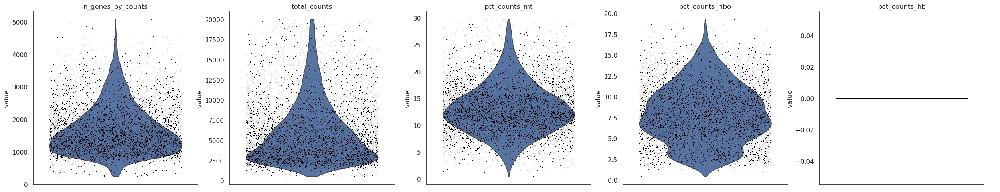

In [ ]:
# Violin plot for the number of genes that are present in each cell, the total counts per cell, and the percentage of counts that are mitochondrial
sc.pl.violin(
    Tumour_only,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo", "pct_counts_hb"],
    jitter=0.4,
    multi_panel=True
)

In [ ]:
df = Tumour_only.obs

In [ ]:
df

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_1.5,leiden_2.0,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio
AAACAGCCAGTTTGTG-D0,D0,8056.0,1891,7.545390,7641.0,8.941415,21.823060,13.584609,7.642979,0.0,...,4,4,1,9,37,B-cell lineage,0.978114,Pro-B cells,0.950723,no
AAACAGCCATGTTTGG-D0,D0,23901.0,2319,7.749322,10986.0,9.304468,21.354451,13.899508,9.111597,0.0,...,8,7,13,63,36,B-cell lineage,0.603815,Pro-B cells,0.370262,no
AAACAGCCATTTAAGC-D0,D0,31317.0,1667,7.419381,6636.0,8.800415,21.503918,13.803495,6.268836,0.0,...,4,4,1,26,134,B-cell lineage,0.951335,Pro-B cells,0.903238,no
AAACATGCATTGGGAG-D0,D0,1039.0,1599,7.377759,6888.0,8.837681,24.811266,18.626598,5.894309,0.0,...,4,4,10,19,81,B-cell lineage,0.121671,Pro-B cells,0.183371,no
AAACCAACAATAACCT-D0,D0,25718.0,1403,7.247081,5495.0,8.611775,24.913558,18.817106,5.150136,0.0,...,4,4,10,8,46,B-cell lineage,0.991872,Pro-B cells,0.996793,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGCTGTTGTAACG-Q3,Q3,3204.0,1982,7.592366,7513.0,8.924523,19.379742,10.941035,7.120990,0.0,...,0,0,11,68,272,B-cell lineage,0.947076,Pro-B cells,0.991950,no
TTTGTGAAGCATGAAG-Q3,Q3,13995.0,2061,7.631432,8523.0,9.050641,21.858501,14.009152,6.112871,0.0,...,7,18,38,30,9,B-cell lineage,0.930010,Pro-B cells,0.984357,no
TTTGTGAAGCGAGTAA-Q3,Q3,34490.0,1361,7.216709,5059.0,8.529121,23.739870,17.019173,8.381103,0.0,...,11,8,23,14,5,B-cell lineage,0.403587,Pro-B cells,0.973642,no
TTTGTGGCAGCCTGCA-Q3,Q3,3673.0,1536,7.337588,6272.0,8.744010,29.432398,23.852041,6.505102,0.0,...,0,0,16,22,58,B-cell lineage,0.484664,Pro-B cells,0.177973,no


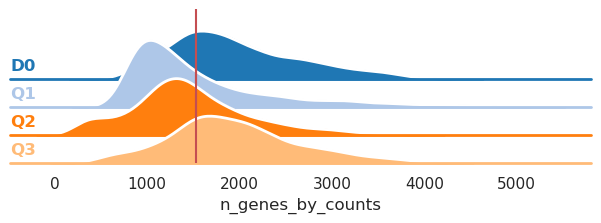

In [ ]:

value = "n_genes_by_counts"

sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

g = sns.FacetGrid(df, row="sample", hue="sample", aspect=15, height=0.5, palette="tab20")

g.map(sns.kdeplot, value, clip_on=False, fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, value, clip_on=False, color="w", lw=2)

g.map(plt.axhline, y=0, lw=2, clip_on=False)

def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, value)

g.figure.subplots_adjust(hspace=-.6)

g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

for ax in g.axes.flat:
    ax.axvline(x=df[value].median(), color='r', linestyle='-')


plt.show()

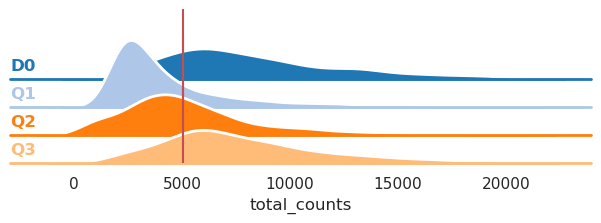

In [ ]:
value = "total_counts"

sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

g = sns.FacetGrid(df, row="sample", hue="sample", aspect=15, height=0.5, palette="tab20")

g.map(sns.kdeplot, value, clip_on=False, fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, value, clip_on=False, color="w", lw=2)

g.map(plt.axhline, y=0, lw=2, clip_on=False)

def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, value)

g.figure.subplots_adjust(hspace=-.6)

g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

for ax in g.axes.flat:
    ax.axvline(x=df[value].median(), color='r', linestyle='-')


plt.show()

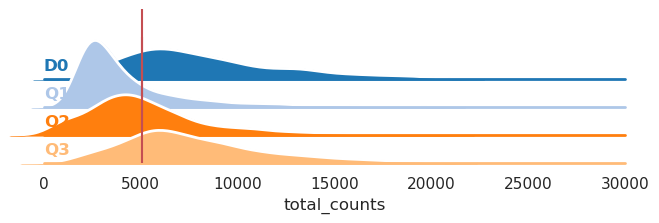

In [ ]:
value = "total_counts"

# Set style
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# Create the FacetGrid
g = sns.FacetGrid(df, row="sample", hue="sample", aspect=15, height=0.5, palette="tab20")

# Plot the KDE plots with different styles
g.map(sns.kdeplot, value, clip_on=False, fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, value, clip_on=False, color="w", lw=2)

# Add a horizontal line at y=0
g.map(plt.axhline, y=0, lw=2, clip_on=False)

# Label function for facet titles
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, value)

# Adjust subplot layout
g.figure.subplots_adjust(hspace=-.6)

# Remove titles and y-axis labels/ticks
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

# Add vertical lines at the median of 'total_counts'
for ax in g.axes.flat:
    ax.axvline(x=df[value].median(), color='r', linestyle='-')

# Crop the x-axis to a max of 40,000
g.set(xlim=(0, 30000))

# Show the plot
plt.show()

# Feature Selection

In [ ]:
#Let's normalize and preprocces again:
def feature_selection(adata):
    sc.experimental.pp.highly_variable_genes(adata, flavor = 'pearson_residuals',n_top_genes = 2500, theta=100)

In [ ]:
#Number of NA
Na = np.isnan(Tumour_only.X.data).sum()
Na

0

# Use Pearson residuals for selection of highly variable genes
Analytic Pearson residuals can be used to identify biologically variable genes. For that, the observed counts are compared to the expected counts of a “null model”. This model includes no biological variability between cells. Pearson residuals are defined such that genes that are not differentially expressed will have variance close to 1. In contrast, if a gene is differentially expressed, it will deviate from the null model, causing larger residuals and residual variance >1 for this gene. More details and comparisons to other gene selection methods can be found in Lause et al. (2021).

In [ ]:
feature_selection(Tumour_only)

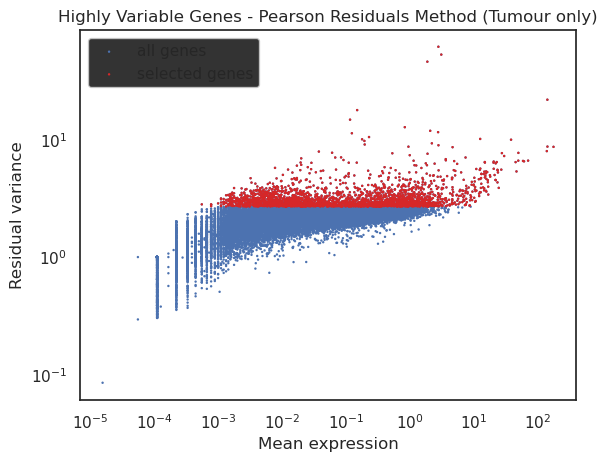

In [ ]:
# Extract the highly variable genes
hvgs = Tumour_only.var["highly_variable"]

# Initialize plot
fig, ax = plt.subplots()

# Scatter plot for all genes
ax.scatter(
    Tumour_only.var["means"], Tumour_only.var["residual_variances"], s=3, edgecolor="none", label="all genes"
)

# Scatter plot for highly variable genes (HVGs)
ax.scatter(
    Tumour_only.var["means"][hvgs],
    Tumour_only.var["residual_variances"][hvgs],
    c="tab:red",
    label="selected genes",
    s=3,
    edgecolor="none",
)

# Set log scale for both axes
plt.xscale("log")
plt.yscale("log")

# Set axis labels
plt.xlabel("Mean expression")
plt.ylabel("Residual variance")

# Set plot title
plt.title("Highly Variable Genes - Pearson Residuals Method (Tumour only)")

# Show legend
plt.legend()

# Display the plot
plt.show()


In [ ]:
Tumour_only

AnnData object with n_obs × n_vars = 8981 × 36601
    obs: 'sample', 'dna_total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'outlier', 'mt_outlier', 'ribo_outlier', 'doublet_outlier', 'leiden', 'leiden_0.05', 'leiden_0.5', 'leiden_0.6', 'leiden_0.75', 'leiden_0.8', 'leiden_0.85', 'leiden_0.9', 'leiden_0.95', 'leiden_1.0', 'leiden_1.25', 'leiden_1.5', 'leiden_2.0', 'leiden_5.0', 'leiden_10.0', 'leiden_20.0', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'doublets_ratio'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'chromosome', 'start', 'end', 'variances',

In [ ]:
Na = np.isnan(Tumour_only.X.data).sum()
Na

0

In [ ]:
Tumour_only.layers["raw"] = Tumour_only.X.copy()
Tumour_only.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(Tumour_only, inplace=False)["X"]
)

# Normalization


In [ ]:
sc.experimental.pp.normalize_pearson_residuals(Tumour_only)

In [ ]:
Na = np.isnan(Tumour_only.X.data).sum()
Na

114067681

In [4]:
# Duplicate to '1', this way we still have all genes for later: -> now use the hvg for the clustering
Tumour_only1 = Tumour_only

ERROR: Error: object 'Tumour_only' not found


In [ ]:
#Subset based on the HEG genes
Tumour_only = Tumour_only[:, hvgs]

In [ ]:
Tumour_only.X

ArrayView([[-0.14357117, -0.92549855, -1.2418962 , ..., -0.44252372,
            -0.06699133, -0.1307965 ],
           [-0.17214417, -1.1076632 ,  3.7875533 , ..., -0.5303898 ,
            -0.08032653, -0.15682833],
           [-0.1337985 ,  0.2871757 , -1.1585222 , ..., -0.4124493 ,
            -0.06243066, -0.12189309],
           ...,
           [-0.11682603,  0.5642823 , -0.03627696, ..., -0.36019486,
            -0.05451037, -0.10643045],
           [-0.1300778 , -0.83914524,  5.007166  , ..., -0.4009966 ,
            -0.06069435, -0.11850337],
           [-0.13785933, -0.88896817, -1.1931969 , ..., -0.42494738,
            -0.06432573, -0.12559271]], dtype=float32)

# Compute PCA and tsne


In [ ]:
sc.pp.pca(Tumour_only, n_comps=15)
n_cells = len(Tumour_only)
sc.tl.tsne(Tumour_only, use_rep="X_pca")

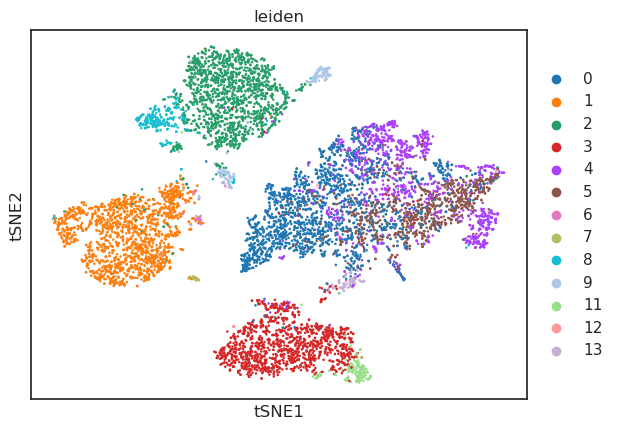

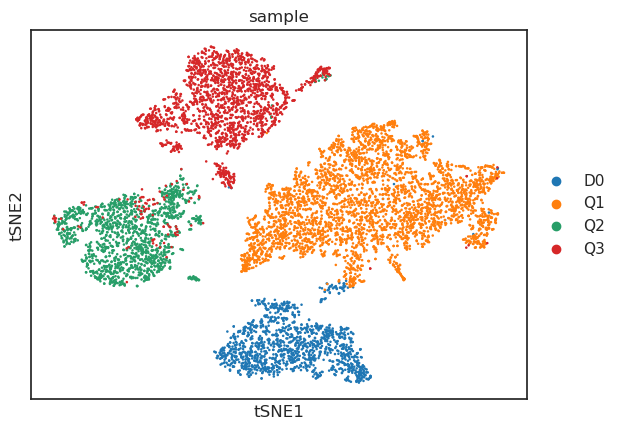

In [ ]:
sc.pl.tsne(Tumour_only, color=["leiden"], cmap="tab20")
sc.pl.tsne(Tumour_only, color=["sample"], cmap="tab20")

# Cluster the cells:

In [ ]:
# Cluster the cells
sc.pp.neighbors(Tumour_only, n_neighbors= 30, n_pcs=15)
sc.tl.leiden(Tumour_only, resolution=0.5)

In [ ]:
sc.tl.umap(Tumour_only)

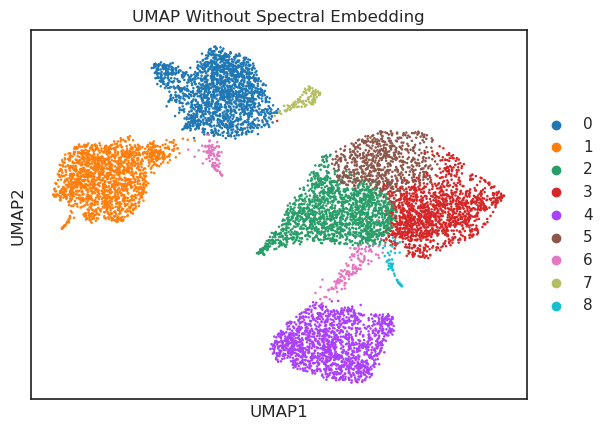

In [ ]:
sc.pl.umap(Tumour_only, color="leiden", title="UMAP Without Spectral Embedding")

# Spectral embedding:

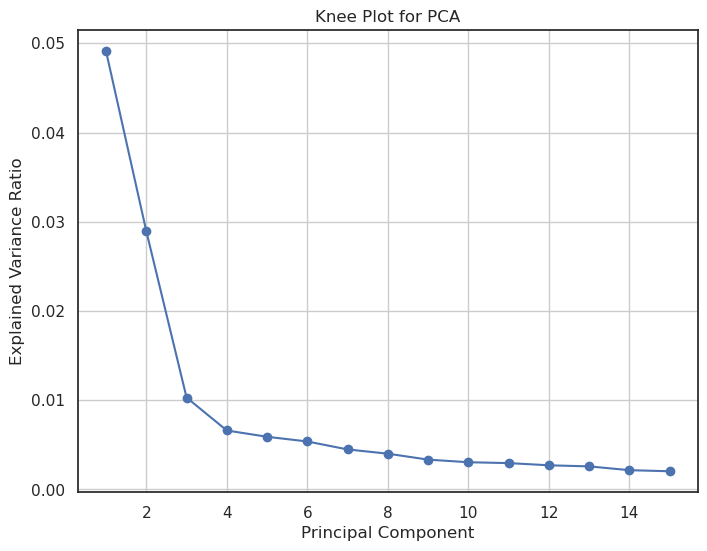

In [ ]:
# Extract the explained variance ratio from PCA
explained_variance_ratio = Tumour_only.uns['pca']['variance_ratio']

# Plot the explained variance ratio as a knee/elbow plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='-')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Knee Plot for PCA')
plt.grid(True)
plt.show()

In [ ]:
#Spectral embeddig:
embedding = SpectralEmbedding(n_components=15, affinity='nearest_neighbors').fit_transform(Tumour_only.X)

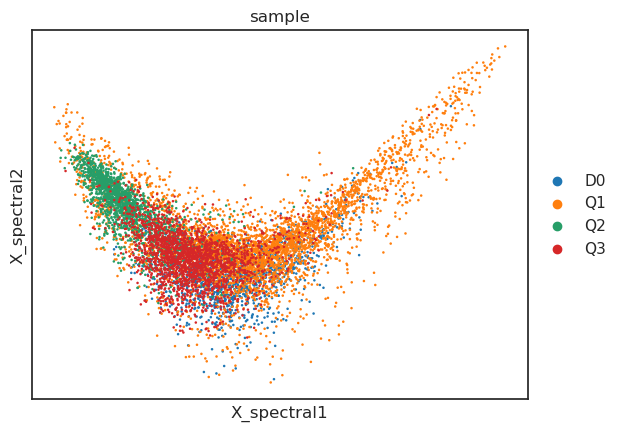

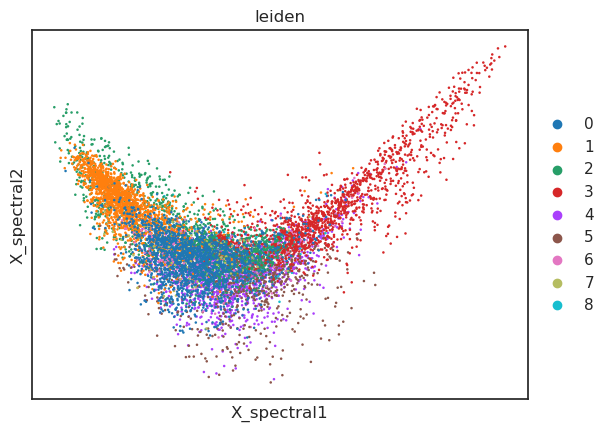

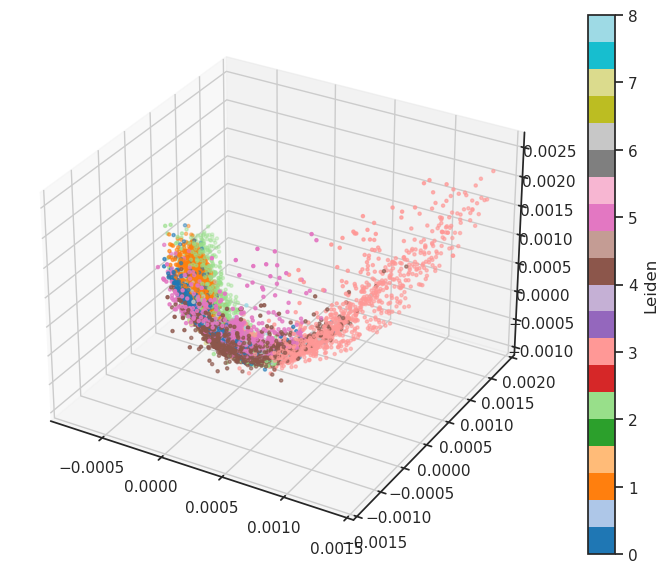

In [ ]:
#Spectral embeding:
# Store the embedding in adata.obsm with a custom key
Tumour_only.obsm['X_spectral'] = embedding
# Visualize the spectral embedding based on normal cells and leiden clusters
sc.pl.embedding(Tumour_only, basis='X_spectral', color="sample")
sc.pl.embedding(Tumour_only, basis='X_spectral', color="leiden")
# Make a 3D graph of the same input
# Convert categorical Leiden clusters to numerical values
leiden_numeric = Tumour_only.obs['leiden'].astype('category').cat.codes
# Create a 3D figure
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
# Plot the first three spectral components
scan = ax.scatter(
    Tumour_only.obsm['X_spectral'][:, 0],  # First spectral component
    Tumour_only.obsm['X_spectral'][:, 1],  # Second spectral component
    Tumour_only.obsm['X_spectral'][:, 2],  # Third spectral component
    c=leiden_numeric,  # Convert leiden clusters to numerical values
    cmap='tab20',  # Colormap
    s=5  # Size of points
)
# Leiden color bar for clustering
cbar = fig.colorbar(scan, ax=ax)
cbar.set_label('Leiden')
# Compute the spectral clustering using sklearn using 15 PCs and specific number of clusters (13)
from sklearn.cluster import SpectralClustering
embedding = SpectralEmbedding(n_components=15, affinity='nearest_neighbors')
X_spectral = embedding.fit_transform(Tumour_only.X)
clustering = SpectralClustering(n_clusters=13, affinity='nearest_neighbors')
Tumour_only.obs['spectral_clusters'] = clustering.fit_predict(X_spectral)


In [ ]:
# Apply UMAP on the spectral embedding
sc.pp.neighbors(Tumour_only, use_rep='X_spectral')  # Use the spectral embedding to compute the neighbors
sc.tl.umap(Tumour_only)  # Apply UMAP

In [ ]:
# Redo clutering on the UMAP embedding
sc.tl.leiden(Tumour_only, resolution=0.3)

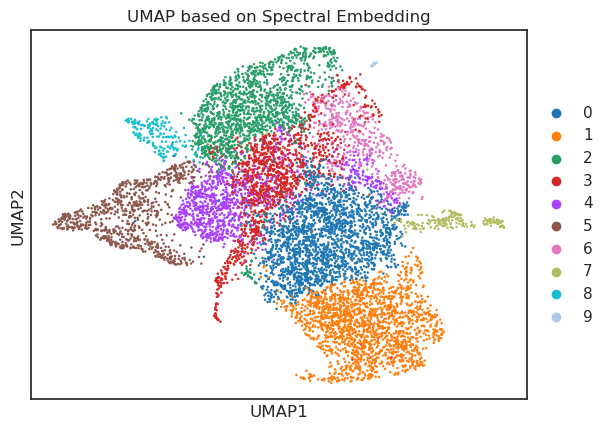

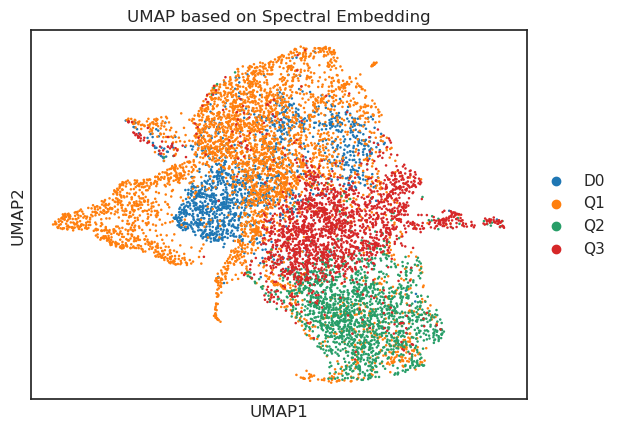

In [ ]:
# Plot the UMAP based on the spectral embedding
sc.pl.umap(Tumour_only, color="leiden", title="UMAP based on Spectral Embedding")
# Plot the UMAP based on the spectral embedding
sc.pl.umap(Tumour_only, color="sample", title="UMAP based on Spectral Embedding", save = "UMAP_based_on_Spectral_Embedding.pdf")


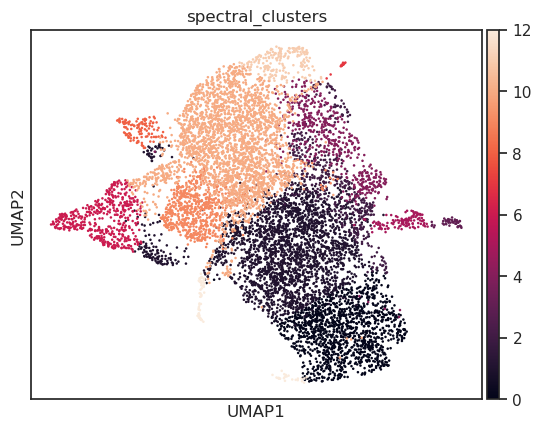

In [ ]:
sc.pl.umap(Tumour_only, color=['spectral_clusters'])


In [ ]:
#Re-cluster the 4 timepoints

Tumour_only_0 = Tumour_only[Tumour_only.obs['sample'] == 'D0', :].copy()


Tumour_only_1 = Tumour_only[Tumour_only.obs['sample'] == 'Q1', :].copy()


Tumour_only_2 = Tumour_only[Tumour_only.obs['sample'] == 'Q2', :].copy()

Tumour_only_3 = Tumour_only[Tumour_only.obs['sample'] == 'Q3', :].copy()

In [ ]:
sc.pp.neighbors(Tumour_only_0, n_neighbors=20, use_rep='X_spectral')
sc.tl.leiden(Tumour_only_0, resolution=0.2)

sc.pp.neighbors(Tumour_only_1, n_neighbors=20, use_rep='X_spectral')
sc.tl.leiden(Tumour_only_1, resolution=0.2)

sc.pp.neighbors(Tumour_only_2, n_neighbors=20, use_rep='X_spectral')
sc.tl.leiden(Tumour_only_2, resolution=0.2)

sc.pp.neighbors(Tumour_only_3, n_neighbors=20, use_rep='X_spectral')
sc.tl.leiden(Tumour_only_3, resolution=0.2)

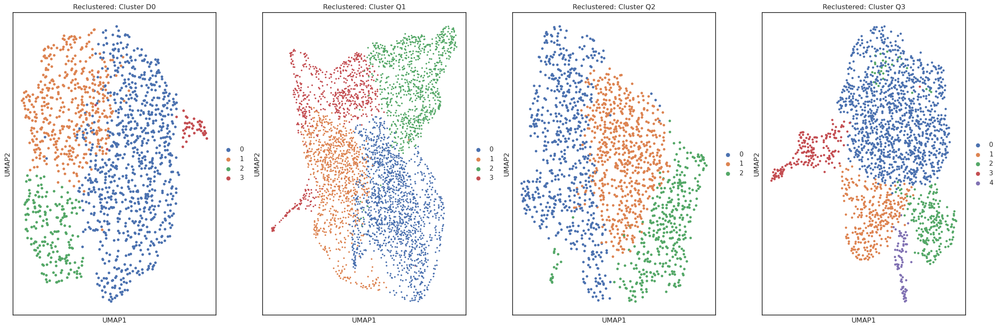

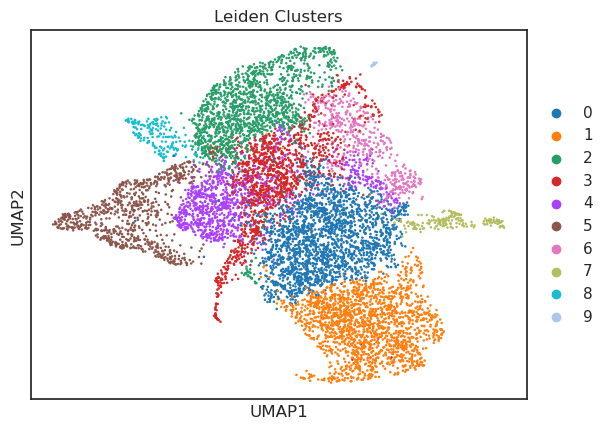

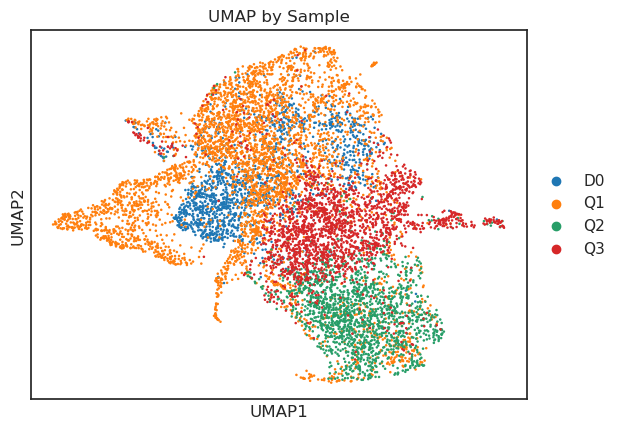

In [ ]:
# Create a figure with 4 subplots
fig, axes = plt.subplots(1, 4, figsize=(24, 8))

# For cluster 0
sc.tl.umap(Tumour_only_0)
sc.pl.umap(Tumour_only_0, color="leiden", title="Reclustered: Cluster D0", ax=axes[0], show=False)

# For cluster 1
sc.tl.umap(Tumour_only_1)
sc.pl.umap(Tumour_only_1, color="leiden", title="Reclustered: Cluster Q1", ax=axes[1], show=False)

# For cluster 2
sc.tl.umap(Tumour_only_2)
sc.pl.umap(Tumour_only_2, color="leiden", title="Reclustered: Cluster Q2", ax=axes[2], show=False)

# For cluster 3
sc.tl.umap(Tumour_only_3)
sc.pl.umap(Tumour_only_3, color="leiden", title="Reclustered: Cluster Q3", ax=axes[3], show=False)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Plot the UMAP of the whole Tumour_only object with Leiden clusters
sc.pl.umap(Tumour_only, color="leiden", title="Leiden Clusters")

# Optionally, plot UMAP based on 'sample' annotation
sc.pl.umap(Tumour_only, color="sample", title="UMAP by Sample")


In [ ]:
for res in [0.1, 0.2, 0.3, 0.5, 0.7,1.0]:
    sc.tl.leiden(
        Tumour_only, key_added=f"leiden_res_{res:4.2f}", resolution=res, n_iterations=100, flavor="leidenalg"
    )

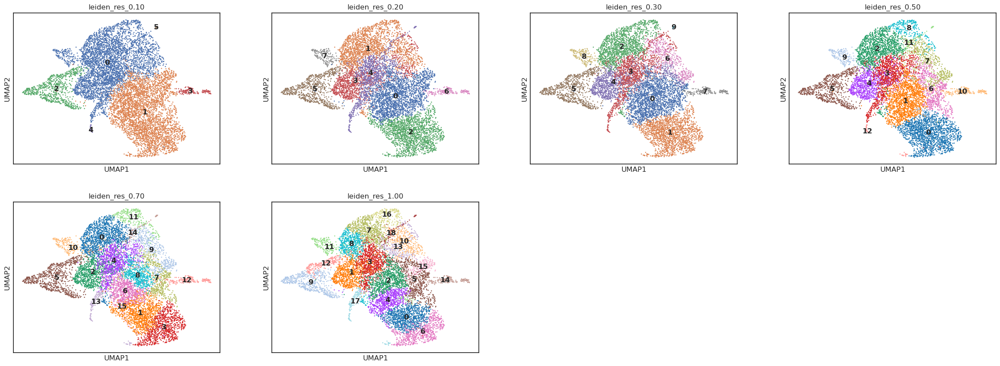

In [ ]:
sc.pl.umap(
    Tumour_only,
    color=["leiden_res_0.10", "leiden_res_0.20", "leiden_res_0.30", "leiden_res_0.50", "leiden_res_0.70","leiden_res_1.00"],
    legend_loc="on data",
)

# Resolution 0.5 is the best


In [ ]:
def leiden_clustering_and_umap(Tumour_only, resolutions=[0.1, 0.2, 0.3, 0.5, 0.7, 1.0], n_iterations=100, figsize=(24, 8)):
    """
    Perform Leiden clustering on the Tumour_only dataset for multiple resolutions
    and plot UMAP with clusters for each resolution.

    Parameters:
    - Tumour_only: AnnData object
    - resolutions: List of resolutions for Leiden clustering (default is [0.1, 0.2, 0.3, 0.5, 0.7, 1.0])
    - n_iterations: Number of iterations for the Leiden algorithm (default is 100)
    """
    
    # Perform Leiden clustering for each resolution
    for res in resolutions:
        sc.tl.leiden(
            Tumour_only, 
            key_added=f"leiden_res_{res:4.2f}", 
            resolution=res, 
            n_iterations=n_iterations, 
            flavor="leidenalg"
        )
    
    # Plot UMAP for all the resolutions
    color_list = [f"leiden_res_{res:4.2f}" for res in resolutions]
    
    sc.pl.umap(
        Tumour_only,
        color=color_list,
        legend_loc="on data",
        title=[f"Leiden Clusters (res {res:4.2f})" for res in resolutions],
        ncols=2  # Display UMAPs in two columns
    )

In [ ]:
# Now first do the same for the different timepoints and save the objects

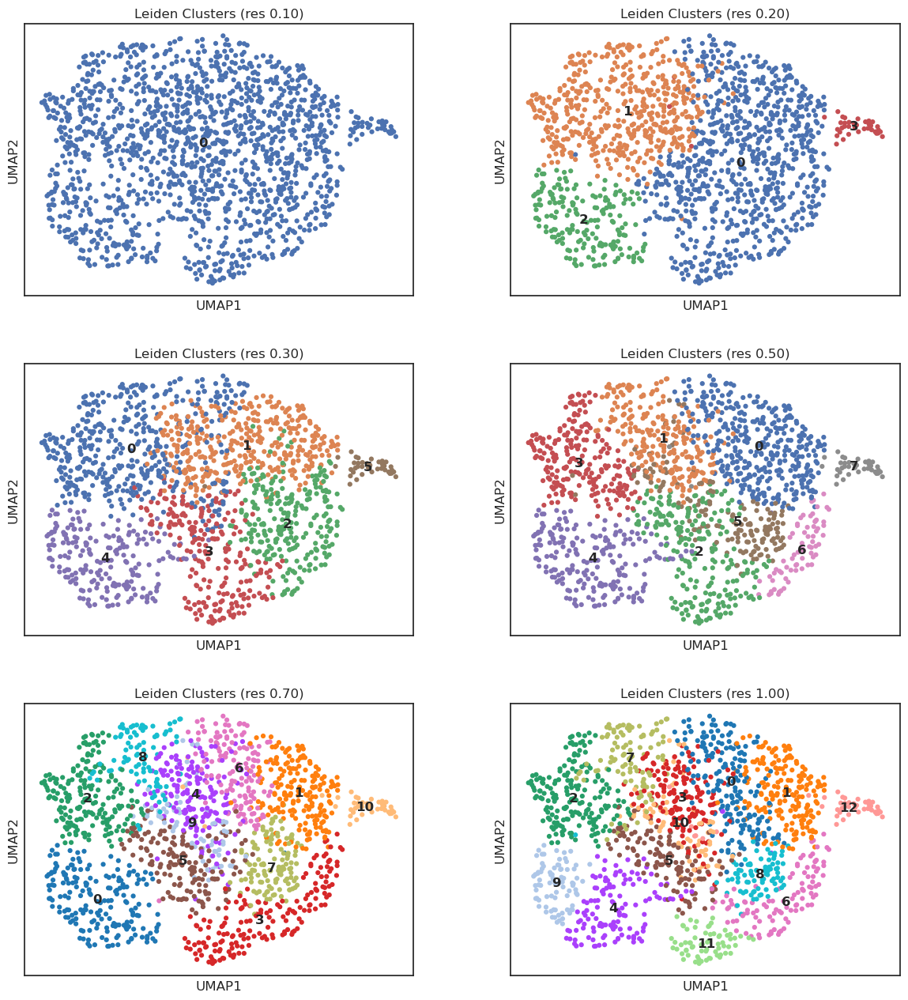

In [ ]:
leiden_clustering_and_umap(Tumour_only_0)

In [ ]:
#Resolution 0.2 or 0.3

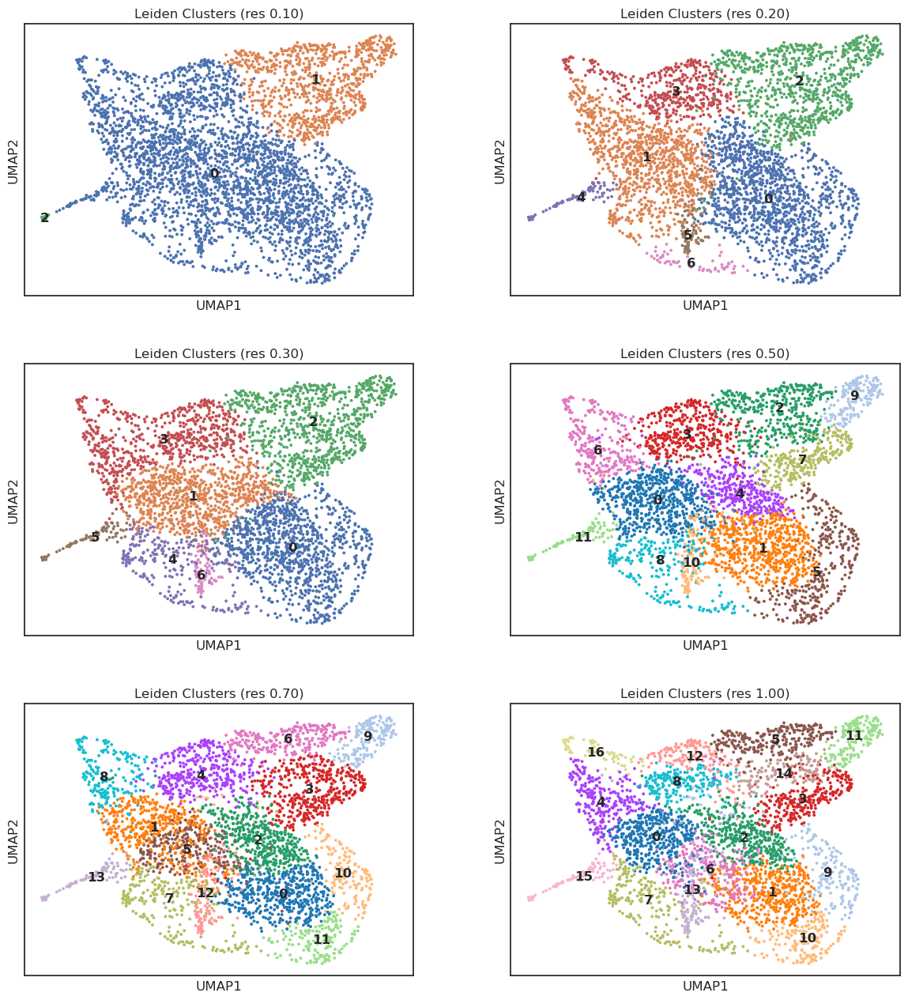

In [ ]:
leiden_clustering_and_umap(Tumour_only_1)

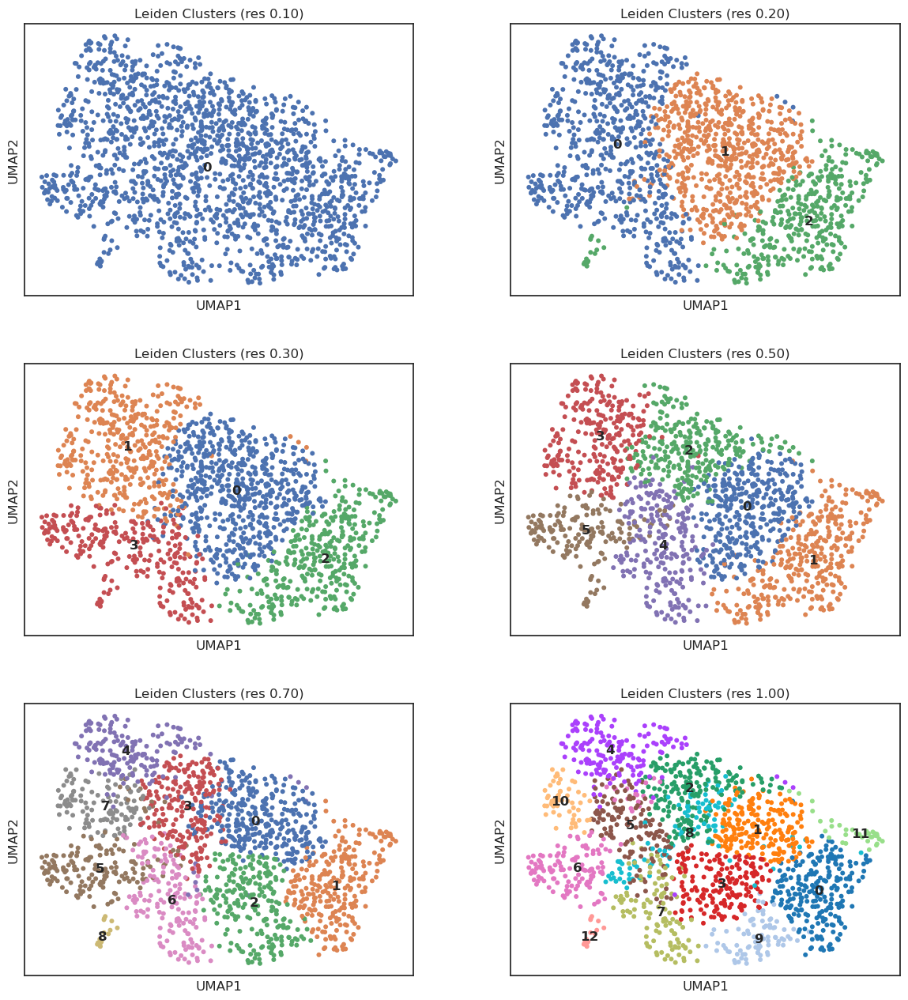

In [ ]:
leiden_clustering_and_umap(Tumour_only_2)

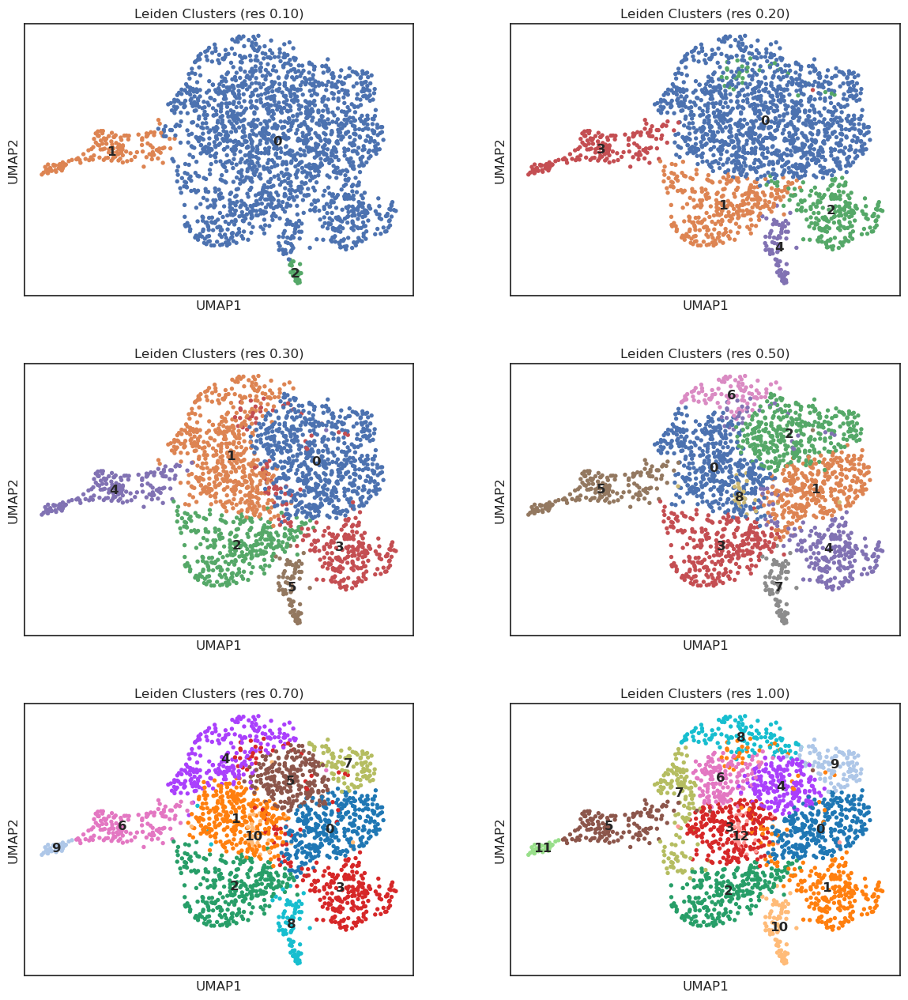

In [ ]:
leiden_clustering_and_umap(Tumour_only_3)

In [ ]:
# Save the seperte timepoint for DEG analysis

In [ ]:
path_to_save = "/Tumour_only_cells_D0.h5ad"
Tumour_only_0.write_h5ad(path_to_save)

In [ ]:
D0=sc.read_h5ad("/Tumour_only_cells_D0.h5ad")

In [ ]:
barcodes_D0 = D0.obs.index.tolist()

In [ ]:
path_to_save = "/barcodes_tumour_cells_D0.tsv"
# Convert the list to a pandas DataFrame and save it as a .tsv file
df = pd.DataFrame(barcodes_D0, columns=['barcode'])
df.to_csv(path_to_save, sep='\t', index=False, header=False)

In [ ]:
path_to_save = "/Tumour_only_cells_Q1.h5ad"
Tumour_only_1.write_h5ad(path_to_save)


In [ ]:
Q1=sc.read_h5ad("/Tumour_only_cells_Q1.h5ad")

In [ ]:
barcodes_Q1 = Q1.obs.index.tolist()
path_to_save = "/barcodes_tumour_cells_Q1.tsv"
# Convert the list to a pandas DataFrame and save it as a .tsv file
df = pd.DataFrame(barcodes_Q1, columns=['barcode'])
df.to_csv(path_to_save, sep='\t', index=False, header=False)

In [ ]:
path_to_save = "/Tumour_only_cells_Q2.h5ad"
Tumour_only_2.write_h5ad(path_to_save)

Q2=sc.read_h5ad("/Tumour_only_cells_Q2.h5ad")
barcodes_Q2 = Q2.obs.index.tolist()
path_to_save = "/barcodes_tumour_cells_Q2.tsv"
df = pd.DataFrame(barcodes_Q2, columns=['barcode'])
df.to_csv(path_to_save, sep='\t', index=False, header=False)

In [ ]:
path_to_save = "/Tumour_only_cells_Q3.h5ad"
Tumour_only_3.write_h5ad(path_to_save)

Q3=sc.read_h5ad("/Tumour_only_cells_Q3.h5ad")
barcodes_Q3 = Q3.obs.index.tolist()
path_to_save = "/barcodes_tumour_cells_Q3.tsv"
df = pd.DataFrame(barcodes_Q3, columns=['barcode'])
df.to_csv(path_to_save, sep='\t', index=False, header=False)

In [ ]:
#Save the big object as well
path_to_save = "/Tumour_only_cells.h5ad"

In [ ]:
Tumour_only.write_h5ad(path_to_save)

# DEG analysis on the Tumour only data:

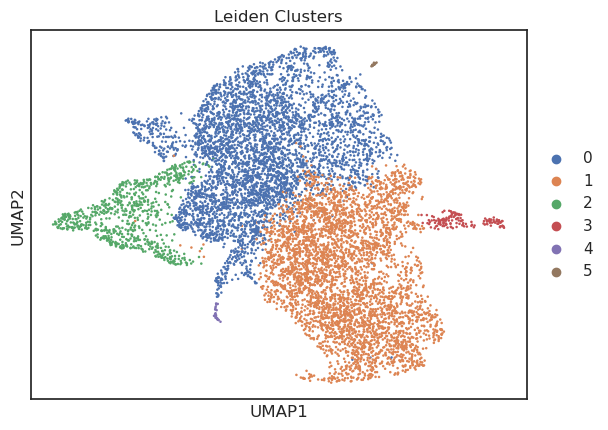

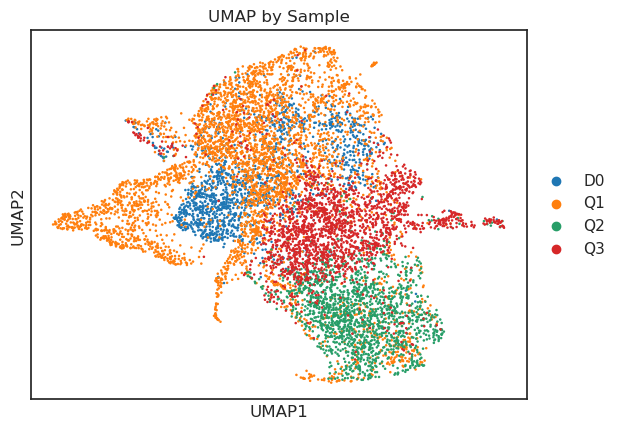

In [ ]:
# Plot the UMAP of the whole Tumour_only object with Leiden clusters
sc.pl.umap(Tumour_only, color="leiden_res_0.10", title="Leiden Clusters")

# Optionally, plot UMAP based on 'sample' annotation
sc.pl.umap(Tumour_only, color="sample", title="UMAP by Sample")


In [ ]:
# T-test:
#sc.tl.rank_genes_groups(Tumour_only, 'sample', method='t-test', key_added = "t-test", pts= True) #old
#sc.pl.rank_genes_groups(Tumour_only, n_genes=25, sharey=False, key = "t-test", pts =True) #old

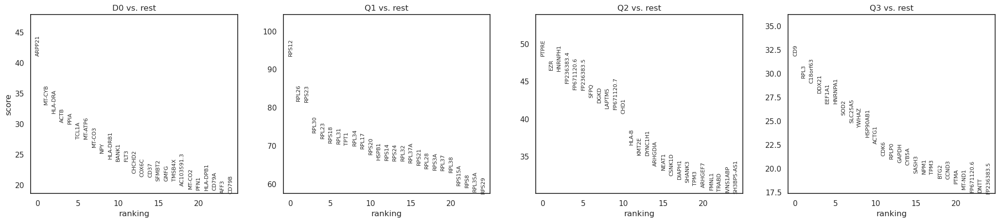

In [ ]:
# T-test:
sc.tl.rank_genes_groups(Tumour_only, 'sample', method='t-test', key_added = "t-test", pts= True)
sc.pl.rank_genes_groups(Tumour_only, n_genes=25, sharey=False, key = "t-test", pts =True)

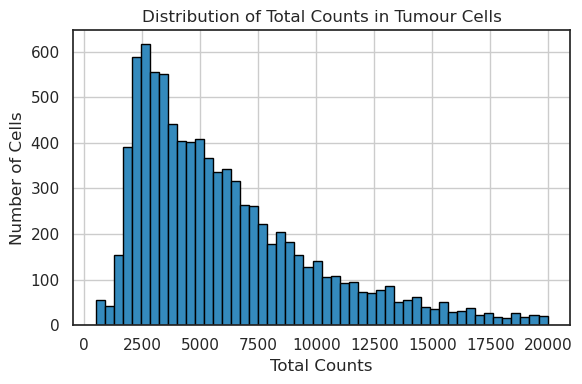

In [ ]:
plt.figure(figsize=(6, 4))
plt.hist(Tumour_only.obs["total_counts"], bins=50, color='#348ABD', edgecolor='black')
plt.xlabel("Total Counts")
plt.ylabel("Number of Cells")
plt.title("Distribution of Total Counts in Tumour Cells")
plt.grid(True)
plt.tight_layout()
plt.show()

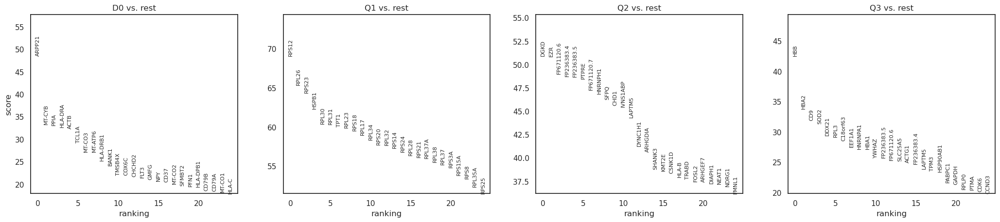

In [ ]:
#T-test overestimated_variance
sc.tl.rank_genes_groups(Tumour_only, 'sample', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(Tumour_only, n_genes=25, sharey=False, key = "wilcoxon", save="Rank_genes_DEG.pdf")

In [ ]:
!ls

Doublets_chr3_vs_DNA.pdf     Volcano_plot_pseudobulk_D0vsQ1.pdf
Doublets_chr3_vs_RNA.pdf     figures
Isochromosome.pdf	     ranked_genes.txt
PCA_pseudobulk.pdf	     top10_D0.txt
Volcano_plot_D0_vs_rest.pdf  top10_Q1.txt
Volcano_plot_Q1_vs_rest.pdf  top10_Q2.txt
Volcano_plot_Q2_vs_rest.pdf  top10_Q3.txt
Volcano_plot_Q3_vs_rest.pdf  top10_merged.csv


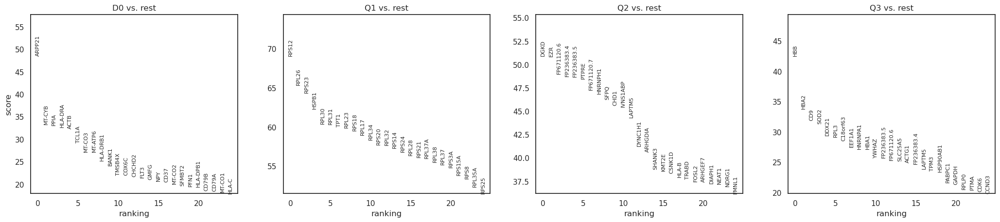

In [ ]:
#Wilcoxon
sc.tl.rank_genes_groups(Tumour_only, 'sample', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(Tumour_only, n_genes=25, sharey=False, key="wilcoxon")

In [ ]:
genes=sc.tl.rank_genes_groups(Tumour_only, 'sample', method='wilcoxon', key_added = "wilcoxon")


In [ ]:
Tumour_only.var

,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,...,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,chromosome,start,end,variances,residual_variances,highly_variable_rank
FGR,False,False,False,385,0.073005,0.070463,96.769321,870.0,6.769642,True,...,1.020881,0.753578,2,False,chr1,27612064.0,27635185.0,0.053964,3.140386,851.0
E2F2,False,False,False,3424,1.066544,0.725877,71.267937,12710.0,9.450223,True,...,1.297197,1.539288,2,False,chr1,23506438.0,23531233.0,2.756225,2.756372,2073.0
CSDE1,False,False,False,5594,1.999916,1.098584,53.058656,23833.0,10.078869,True,...,1.095598,-0.300961,0,False,chr1,114716913.0,114758676.0,4.573157,2.855524,1613.0
RUNX3,False,False,False,1256,0.283545,0.249625,89.460435,3379.0,8.125631,True,...,1.079214,0.801420,2,False,chr1,24899511.0,24965121.0,0.408262,2.743566,2132.0
TPR,False,False,False,5932,2.361920,1.212512,50.222371,28147.0,10.245232,True,...,1.199128,-0.074555,0,False,chr1,186311652.0,186375693.0,5.674091,2.851769,1626.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SLC25A53,False,False,False,543,0.093899,0.089749,95.443484,1119.0,7.021084,True,...,1.117469,0.976443,2,False,chrX,104099214.0,104157009.0,0.168802,2.749405,2103.0
MIR222HG,False,False,False,3774,1.209029,0.792553,68.330956,14408.0,9.575608,True,...,1.229360,1.074888,3,False,chrX,45745210.0,45770274.0,2.783385,2.926778,1353.0
AL034397.3,False,False,False,1230,0.293698,0.257505,89.678610,3500.0,8.160804,True,...,1.251761,1.357092,3,False,chrnan,NaN,NaN,0.492993,2.908518,1409.0
AL591378.1,False,False,False,20,0.005119,0.005106,99.832173,61.0,4.127134,True,...,0.622877,-0.002024,1,False,chrnan,NaN,NaN,0.015355,3.083659,971.0


In [ ]:
result = Tumour_only.uns["wilcoxon"]
groups = result["names"].dtype.names  # e.g., ('group1', 'group2', ...)
top_genes = {group: result["names"][group].tolist() for group in groups}

In [ ]:
top_genes

{'D0': ['ARPP21',
  'MT-CYB',
  'PPIA',
  'HLA-DRA',
  'ACTB',
  'TCL1A',
  'MT-CO3',
  'MT-ATP6',
  'HLA-DRB1',
  'BANK1',
  'TMSB4X',
  'COX6C',
  'CHCHD2',
  'FLT3',
  'GMFG',
  'NPY',
  'CD37',
  'MT-CO2',
  'SFMBT2',
  'PFN1',
  'HLA-DPB1',
  'CD79B',
  'CD79A',
  'MT-CO1',
  'HLA-C',
  'HLA-DQB1',
  'SERF2',
  'MME',
  'AFF3',
  'COX7A2',
  'CXCR4',
  'UHRF1',
  'COX6A1',
  'NDUFA4',
  'EEF1A1',
  'TOP2B',
  'HIST2H2AA4',
  'HLA-DPA1',
  'RPS29',
  'CYTL1',
  'GAB1',
  'HIST2H2AA3',
  'AC103591.3',
  'ETS2',
  'RPS11',
  'PAN3',
  'HLA-DQA1',
  'TMSB10',
  'IFITM2',
  'RPL27',
  'AL359987.1',
  'FAU',
  'DBI',
  'H3F3B',
  'PRDX1',
  'NAA38',
  'MBNL1',
  'RPL6',
  'CCND3',
  'RPL29',
  'COX8A',
  'RNASEK',
  'ATP5F1E',
  'IGHM',
  'LSM7',
  'TOMM6',
  'H3F3A',
  'HMGB2',
  'CKLF',
  'UBB',
  'VPREB3',
  'BCL11A',
  'ANKRD28',
  'SOD1',
  'MIS18BP1',
  'RPS17',
  'PLAC8',
  'HLA-B',
  'SSH2',
  'ERG',
  'B2M',
  'MYL12A',
  'MT-ND3',
  'RPL18A',
  'TUBA1B',
  'HIST1H2BK',
  'ATP5

In [ ]:
data = {
    group: result["names"][group].tolist()
    for group in groups
}
df = pd.DataFrame(data)

# Save to tab-delimited text file
df.to_csv("ranked_genes.txt", sep="\t", index=False)

In [ ]:
Tumour_only.obs.columns

Index(['sample', 'dna_total_counts', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo',
       'pct_counts_hb', 'outlier', 'mt_outlier', 'ribo_outlier',
       'doublet_outlier', 'leiden', 'leiden_0.05', 'leiden_0.5', 'leiden_0.6',
       'leiden_0.75', 'leiden_0.8', 'leiden_0.85', 'leiden_0.9', 'leiden_0.95',
       'leiden_1.0', 'leiden_1.25', 'leiden_1.5', 'leiden_2.0', 'leiden_5.0',
       'leiden_10.0', 'leiden_20.0', 'celltypist_cell_label_coarse',
       'celltypist_conf_score_coarse', 'celltypist_cell_label_fine',
       'celltypist_conf_score_fine', 'doublets_ratio', 'spectral_clusters',
       'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.30',
       'leiden_res_0.50', 'leiden_res_0.70', 'leiden_res_1.00'],
      dtype='object')

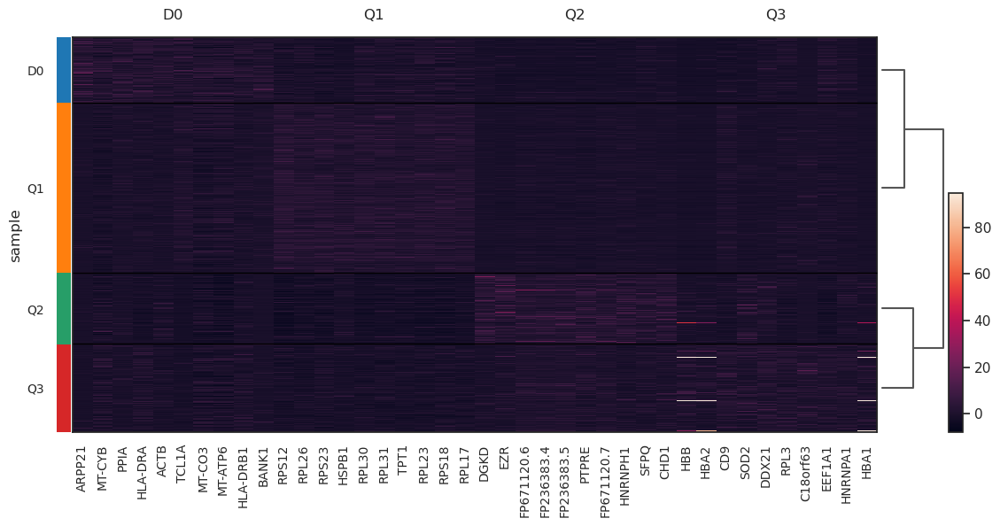

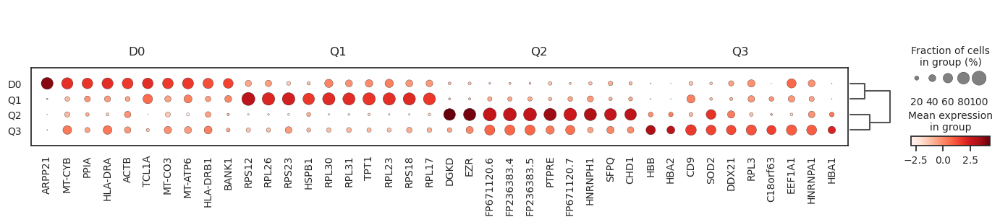

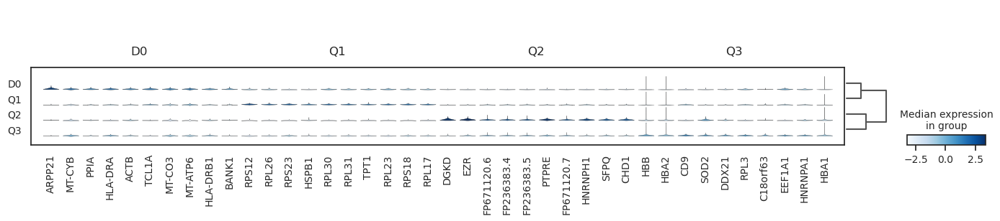

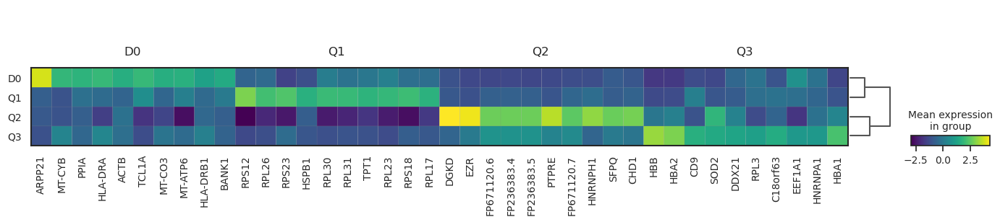

In [ ]:
sc.pl.rank_genes_groups_heatmap(Tumour_only, n_genes=10, key="wilcoxon", groupby="sample", show_gene_labels=True)
sc.pl.rank_genes_groups_dotplot(Tumour_only, n_genes=10, key="wilcoxon", groupby="sample", save ="Rank_genes_DEG_timepoints.pdf")
sc.pl.rank_genes_groups_stacked_violin(Tumour_only, n_genes=10, key="wilcoxon", groupby="sample")
sc.pl.rank_genes_groups_matrixplot(Tumour_only, n_genes=10, key="wilcoxon", groupby="sample")

In [ ]:
from itertools import combinations
# Use timepoints or samples as needed
timepoints = Tumour_only.obs["sample"].unique().tolist()  # or .obs["timepoint"]

# Initialize DEG count matrix
deg_counts = pd.DataFrame(index=timepoints, columns=timepoints, dtype=int)

# Pairwise DEG testing
for tp1, tp2 in combinations(timepoints, 2):
    subset = Tumour_only[Tumour_only.obs["sample"].isin([tp1, tp2])]
    sc.tl.rank_genes_groups(subset, groupby="sample", groups=[tp1], reference=tp2, method="wilcoxon")

    # Get DEGs with adjusted p-value < 0.05
    pvals_adj = pd.DataFrame(subset.uns["rank_genes_groups"]["pvals_adj"]).iloc[:, 0]
    count = (pvals_adj < 0.05).sum()
    
    # Fill symmetric matrix
    deg_counts.loc[tp1, tp2] = count
    deg_counts.loc[tp2, tp1] = count

# Fill diagonal with 0s
np.fill_diagonal(deg_counts.values, 0)

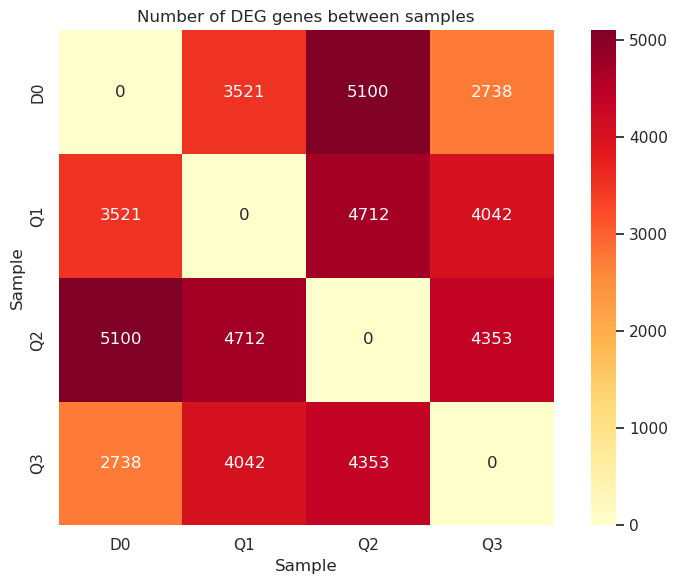

In [ ]:
# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(deg_counts.astype(float), annot=True, cmap="YlOrRd", fmt=".0f", square=True)
plt.title("Number of DEG genes between samples")
plt.xlabel("Sample")
plt.ylabel("Sample")
plt.tight_layout()
plt.savefig("DEG_variation.pdf", format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
Tumour_only.obs

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_1.5,leiden_2.0,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio
AAACAGCCAGTTTGTG-D0,D0,8056.0,1891,7.545390,7641.0,8.941415,21.823060,13.584609,7.642979,0.0,...,4,4,1,9,37,B-cell lineage,0.978114,Pro-B cells,0.950723,no
AAACAGCCATGTTTGG-D0,D0,23901.0,2319,7.749322,10986.0,9.304468,21.354451,13.899508,9.111597,0.0,...,8,7,13,63,36,B-cell lineage,0.603815,Pro-B cells,0.370262,no
AAACAGCCATTTAAGC-D0,D0,31317.0,1667,7.419381,6636.0,8.800415,21.503918,13.803495,6.268836,0.0,...,4,4,1,26,134,B-cell lineage,0.951335,Pro-B cells,0.903238,no
AAACATGCATTGGGAG-D0,D0,1039.0,1599,7.377759,6888.0,8.837681,24.811266,18.626598,5.894309,0.0,...,4,4,10,19,81,B-cell lineage,0.121671,Pro-B cells,0.183371,no
AAACCAACAATAACCT-D0,D0,25718.0,1403,7.247081,5495.0,8.611775,24.913558,18.817106,5.150136,0.0,...,4,4,10,8,46,B-cell lineage,0.991872,Pro-B cells,0.996793,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGCTGTTGTAACG-Q3,Q3,3204.0,1982,7.592366,7513.0,8.924523,19.379742,10.941035,7.120990,0.0,...,0,0,11,68,272,B-cell lineage,0.947076,Pro-B cells,0.991950,no
TTTGTGAAGCATGAAG-Q3,Q3,13995.0,2061,7.631432,8523.0,9.050641,21.858501,14.009152,6.112871,0.0,...,7,18,38,30,9,B-cell lineage,0.930010,Pro-B cells,0.984357,no
TTTGTGAAGCGAGTAA-Q3,Q3,34490.0,1361,7.216709,5059.0,8.529121,23.739870,17.019173,8.381103,0.0,...,11,8,23,14,5,B-cell lineage,0.403587,Pro-B cells,0.973642,no
TTTGTGGCAGCCTGCA-Q3,Q3,3673.0,1536,7.337588,6272.0,8.744010,29.432398,23.852041,6.505102,0.0,...,0,0,16,22,58,B-cell lineage,0.484664,Pro-B cells,0.177973,no


In [ ]:
timepoints = Tumour_only.obs["sample"].unique().tolist()
gene_names = Tumour_only.var_names

mean_expr = pd.DataFrame(index=timepoints, columns=gene_names)

for tp in timepoints:
    cells = Tumour_only.obs["sample"] == tp
    mean_expr.loc[tp] = Tumour_only[cells].X.mean(axis=0)

In [ ]:
mean_expr 

,SCYL3,C1orf112,FGR,CFH,STPG1,NIPAL3,AK2,KDM1A,TTC22,ST7L,...,AC136616.1,AC133551.1,AC136612.1,AC136616.2,AC141272.1,AC136616.3,AC023491.2,AC007325.1,AC007325.2,AC007325.4
D0,0.033493,0.025219,0.008175,0.0,0.010534,0.040878,0.135943,0.25598,0.000932,0.077249,...,0.0,0.0,0.00038,0.0,0.0,0.0,0.0,0.0,0.0,0.001594
Q1,0.028944,0.025817,0.00572,0.0,0.003944,0.032292,0.092992,0.189435,0.000942,0.076093,...,0.0,0.000816,0.000783,0.0,0.0,0.0,0.0,0.0,0.0,0.000544
Q2,0.010205,0.003988,0.01102,0.002191,0.00297,0.00758,0.061382,0.270633,0.000695,0.033128,...,0.0,0.000288,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002875
Q3,0.030793,0.021384,0.004074,0.0,0.004137,0.032735,0.103598,0.281322,0.0,0.076838,...,0.0,0.000814,0.000216,0.0,0.0,0.0,0.0,0.0,0.0,0.000401


In [ ]:
df=mean_expr

In [ ]:
mean_expr = df.mean(axis=0)

# Step 2: Calculate the 95th percentile
cutoff = mean_expr.quantile(0.80)

# Step 3: Keep only genes with mean expression above cutoff
top_genes = mean_expr[mean_expr > cutoff].index

# Step 4: Subset the original DataFrame to these top genes
df_top5 = df[top_genes]

In [ ]:
df_top5

,AK2,KDM1A,ST7L,E2F2,CDK11A,NADK,CSDE1,TRAF3IP3,SCMH1,ELOA,...,FAM156A,IKBKG,TMEM185A,MIR222HG,Z83843.1,AL034397.3,F8A1,AC245140.2,BX890604.2,AC004556.3
D0,0.135943,0.25598,0.077249,0.279934,0.183846,0.078009,0.362607,0.135106,0.17871,0.113242,...,0.088737,0.061653,0.061562,0.256385,0.141439,0.158486,0.074552,0.04939,0.223566,0.182018
Q1,0.092992,0.189435,0.076093,0.222123,0.154696,0.039277,0.279421,0.141327,0.268235,0.083229,...,0.059332,0.043098,0.043827,0.248698,0.178172,0.084879,0.054604,0.054751,0.178168,0.111929
Q2,0.061382,0.270633,0.033128,0.177161,0.379016,0.038516,0.737586,0.039081,0.107782,0.130948,...,0.041701,0.052271,0.047089,0.385575,0.036764,0.006869,0.022494,0.033041,0.162811,0.05216
Q3,0.103598,0.281322,0.076838,0.316056,0.207104,0.043565,0.566508,0.052464,0.189755,0.156214,...,0.087921,0.06099,0.074853,0.268074,0.161918,0.01099,0.056293,0.066672,0.235933,0.080287


source:Transcriptome dynamics of developing maize leavesand genomewide prediction of cis elements andtheir cognate transcription factors

In [ ]:
# 2. Compute the correlation matrix (PCC)
corr_matrix = df_top5.astype(float).T.corr(method='spearman')  # timepoints x timepoints

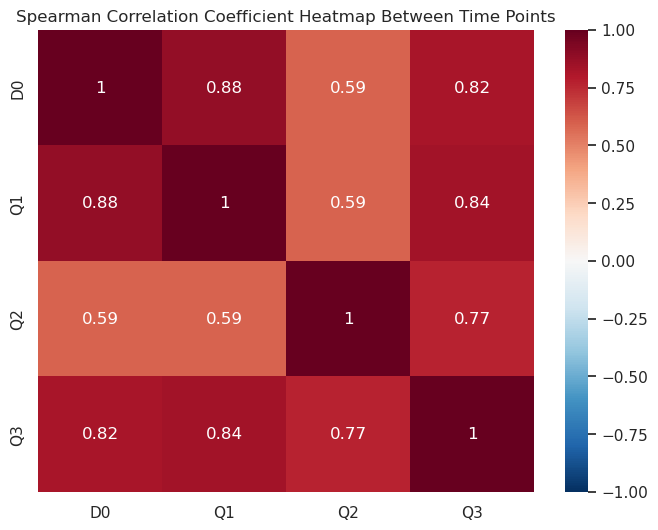

In [ ]:
# 3. Plot the heatmap
plt.figure(figsize=(8, 6))  # Optional: control figure size
sns.heatmap(corr_matrix, annot=True, cmap="RdBu_r", vmin=-1, vmax=1)

# Set the title BEFORE plt.show() and plt.savefig()
plt.title("Spearman Correlation Coefficient Heatmap Between Time Points")

# Save the plot as a PDF
plt.savefig("Spearman_correlation.pdf", format='pdf', bbox_inches='tight')

# Then display it
plt.show()

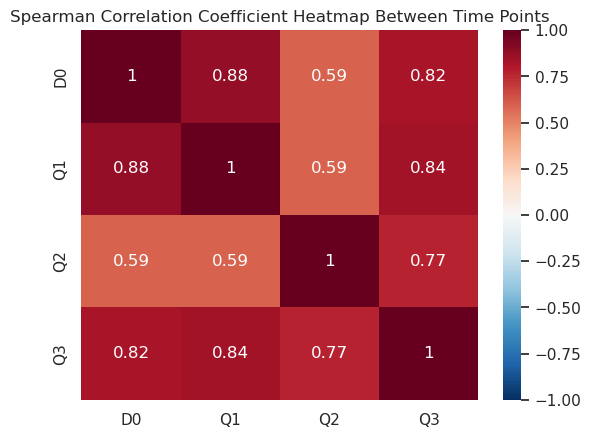

In [ ]:
sns.heatmap(corr_matrix, annot=True, cmap="RdBu_r", vmin=-1, vmax=1)
plt.title("Spearman Correlation Coefficient Heatmap Between Time Points")

# Save the plot as a PDF
plt.savefig("DEG.pdf", format='pdf', bbox_inches='tight')

In [ ]:
!pwd

/lustre1/project/stg_00096/home/projects/2023_Cools_B-ALL/RNA-analysis/final_analysis/output_figures/figures


# Getting normal cells out

In [ ]:
normal_cells = multiome[multiome.obs['celltypist_cell_label_fine'] != "Pro-B cells"].copy()
normal_cells = normal_cells[normal_cells.obs['total_counts'] < 20000, :]
normal_cells.obs


,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_1.5,leiden_2.0,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio
AAAGCCCGTTTATCTG-D0,D0,11416.0,822,6.712956,2622.0,7.872074,22.540046,9.382151,8.047293,0.0,...,15,15,28,17,4,B cells,0.999811,Naive B cells,0.988317,no
AAAGCGGGTTGTAACG-D0,D0,18566.0,1428,7.264730,6199.0,8.732305,30.916277,19.648331,8.388450,0.0,...,14,14,26,5,0,ILC,0.586468,CD16+ NK cells,0.995085,no
AAAGCGGGTTGTTGCT-D0,D0,6117.0,998,6.906755,4100.0,8.318986,30.048780,16.609756,8.170732,0.0,...,14,14,26,5,0,ILC,0.263921,CD16+ NK cells,0.017964,no
AACAAAGGTCATAACG-D0,D0,9281.0,871,6.770789,3440.5,8.143662,34.965848,26.304317,7.179189,0.0,...,15,15,28,17,4,B cells,0.999998,Naive B cells,0.888960,no
AACAGATAGTCAATCA-D0,D0,7458.0,1116,7.018402,3790.0,8.240385,20.633245,6.464380,5.514512,0.0,...,14,14,26,5,0,ILC,0.999525,CD16+ NK cells,0.993318,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCATCAGGCTTAAC-Q3,Q3,0.0,999,6.907755,3079.0,8.032685,19.551803,8.574212,5.423839,0.0,...,7,12,12,0,44,T cells,0.950182,Tem/Trm cytotoxic T cells,0.191916,no
TTTCCTGAGCGGCTGT-Q3,Q3,9267.0,839,6.733402,2956.0,7.991930,28.958051,18.369419,7.780785,0.0,...,7,12,12,0,8,T cells,0.999594,Tem/Trm cytotoxic T cells,0.061687,no
TTTCGTCCATGGAGGC-Q3,Q3,11795.0,1034,6.942157,3512.0,8.164226,24.288155,15.774487,7.260820,0.0,...,7,12,12,0,2,T cells,0.089022,Tem/Trm cytotoxic T cells,0.306166,no
TTTCTTGCACATACTG-Q3,Q3,19034.0,1229,7.114769,4378.0,8.384576,21.059845,12.471448,8.839653,0.0,...,7,12,12,0,2,T cells,0.993989,Tem/Trm cytotoxic T cells,0.390312,no


In [ ]:
normal_cells.obs

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_1.5,leiden_2.0,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio
AAAGCCCGTTTATCTG-D0,D0,11416.0,822,6.712956,2622.0,7.872074,22.540046,9.382151,8.047293,0.0,...,15,15,28,17,4,B cells,0.999811,Naive B cells,0.988317,no
AAAGCGGGTTGTAACG-D0,D0,18566.0,1428,7.264730,6199.0,8.732305,30.916277,19.648331,8.388450,0.0,...,14,14,26,5,0,ILC,0.586468,CD16+ NK cells,0.995085,no
AAAGCGGGTTGTTGCT-D0,D0,6117.0,998,6.906755,4100.0,8.318986,30.048780,16.609756,8.170732,0.0,...,14,14,26,5,0,ILC,0.263921,CD16+ NK cells,0.017964,no
AACAAAGGTCATAACG-D0,D0,9281.0,871,6.770789,3440.5,8.143662,34.965848,26.304317,7.179189,0.0,...,15,15,28,17,4,B cells,0.999998,Naive B cells,0.888960,no
AACAGATAGTCAATCA-D0,D0,7458.0,1116,7.018402,3790.0,8.240385,20.633245,6.464380,5.514512,0.0,...,14,14,26,5,0,ILC,0.999525,CD16+ NK cells,0.993318,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCATCAGGCTTAAC-Q3,Q3,0.0,999,6.907755,3079.0,8.032685,19.551803,8.574212,5.423839,0.0,...,7,12,12,0,44,T cells,0.950182,Tem/Trm cytotoxic T cells,0.191916,no
TTTCCTGAGCGGCTGT-Q3,Q3,9267.0,839,6.733402,2956.0,7.991930,28.958051,18.369419,7.780785,0.0,...,7,12,12,0,8,T cells,0.999594,Tem/Trm cytotoxic T cells,0.061687,no
TTTCGTCCATGGAGGC-Q3,Q3,11795.0,1034,6.942157,3512.0,8.164226,24.288155,15.774487,7.260820,0.0,...,7,12,12,0,2,T cells,0.089022,Tem/Trm cytotoxic T cells,0.306166,no
TTTCTTGCACATACTG-Q3,Q3,19034.0,1229,7.114769,4378.0,8.384576,21.059845,12.471448,8.839653,0.0,...,7,12,12,0,2,T cells,0.993989,Tem/Trm cytotoxic T cells,0.390312,no


In [ ]:
normal_cells_D0 = normal_cells[normal_cells.obs['sample'] == 'D0'].copy()
normal_cells_Q1 = normal_cells[normal_cells.obs['sample'] == 'Q1'].copy()
normal_cells_Q2 = normal_cells[normal_cells.obs['sample'] == 'Q2'].copy()
normal_cells_Q3 = normal_cells[normal_cells.obs['sample'] == 'Q3'].copy()

In [ ]:
normal_cells_D0.obs

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_1.5,leiden_2.0,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio
AAAGCCCGTTTATCTG-D0,D0,11416.0,822,6.712956,2622.0,7.872074,22.540046,9.382151,8.047293,0.0,...,15,15,28,17,4,B cells,0.999811,Naive B cells,0.988317,no
AAAGCGGGTTGTAACG-D0,D0,18566.0,1428,7.264730,6199.0,8.732305,30.916277,19.648331,8.388450,0.0,...,14,14,26,5,0,ILC,0.586468,CD16+ NK cells,0.995085,no
AAAGCGGGTTGTTGCT-D0,D0,6117.0,998,6.906755,4100.0,8.318986,30.048780,16.609756,8.170732,0.0,...,14,14,26,5,0,ILC,0.263921,CD16+ NK cells,0.017964,no
AACAAAGGTCATAACG-D0,D0,9281.0,871,6.770789,3440.5,8.143662,34.965848,26.304317,7.179189,0.0,...,15,15,28,17,4,B cells,0.999998,Naive B cells,0.888960,no
AACAGATAGTCAATCA-D0,D0,7458.0,1116,7.018402,3790.0,8.240385,20.633245,6.464380,5.514512,0.0,...,14,14,26,5,0,ILC,0.999525,CD16+ NK cells,0.993318,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCCCATTGTGGC-D0,D0,9608.0,980,6.888572,3284.0,8.097122,24.086480,14.220463,7.064556,0.0,...,15,15,28,17,4,B cells,0.999758,Naive B cells,0.711822,no
TTTCTTGCATATTGAC-D0,D0,12092.0,1077,6.982863,3861.0,8.258941,29.474229,18.414919,5.568505,0.0,...,14,14,26,5,0,ILC,0.396539,CD16+ NK cells,0.063042,no
TTTGGTGCATAAAGCA-D0,D0,3815.0,1162,7.058758,4176.0,8.337349,23.371648,12.523946,6.202107,0.0,...,14,14,26,5,0,ILC,0.999881,CD16+ NK cells,0.837625,no
TTTGTCTAGGTCGAGG-D0,D0,7951.0,955,6.862758,2908.0,7.975564,25.859697,13.995874,5.570839,0.0,...,14,14,26,5,0,ILC,0.978083,CD16+ NK cells,0.359219,no


In [ ]:
list_of_normals = [normal_cells_D0, normal_cells_Q1, normal_cells_Q2, normal_cells_Q3]


In [ ]:
DNA_barcodes=pd.read_csv("/cellranger_arc_atac.737K-arc-v1.txt.gz")
RNA_barcodes=pd.read_csv("/cellranger_arc_rna.737K-arc-v1.txt.gz")

In [ ]:
for df in list_of_normals:
    df.obs.index = df.obs.index.str.replace('-D0', '')
    df.obs.index = df.obs.index.str.replace('-Q1', '')
    df.obs.index = df.obs.index.str.replace('-Q2', '')
    df.obs.index = df.obs.index.str.replace('-Q3', '')

In [ ]:
list_of_normals[0].obs

,sample,dna_total_counts,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_mt,pct_counts_ribo,pct_counts_hb,...,leiden_1.5,leiden_2.0,leiden_5.0,leiden_10.0,leiden_20.0,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine,doublets_ratio
AAAGCCCGTTTATCTG,D0,11416.0,822,6.712956,2622.0,7.872074,22.540046,9.382151,8.047293,0.0,...,15,15,28,17,4,B cells,0.999811,Naive B cells,0.988317,no
AAAGCGGGTTGTAACG,D0,18566.0,1428,7.264730,6199.0,8.732305,30.916277,19.648331,8.388450,0.0,...,14,14,26,5,0,ILC,0.586468,CD16+ NK cells,0.995085,no
AAAGCGGGTTGTTGCT,D0,6117.0,998,6.906755,4100.0,8.318986,30.048780,16.609756,8.170732,0.0,...,14,14,26,5,0,ILC,0.263921,CD16+ NK cells,0.017964,no
AACAAAGGTCATAACG,D0,9281.0,871,6.770789,3440.5,8.143662,34.965848,26.304317,7.179189,0.0,...,15,15,28,17,4,B cells,0.999998,Naive B cells,0.888960,no
AACAGATAGTCAATCA,D0,7458.0,1116,7.018402,3790.0,8.240385,20.633245,6.464380,5.514512,0.0,...,14,14,26,5,0,ILC,0.999525,CD16+ NK cells,0.993318,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCCCATTGTGGC,D0,9608.0,980,6.888572,3284.0,8.097122,24.086480,14.220463,7.064556,0.0,...,15,15,28,17,4,B cells,0.999758,Naive B cells,0.711822,no
TTTCTTGCATATTGAC,D0,12092.0,1077,6.982863,3861.0,8.258941,29.474229,18.414919,5.568505,0.0,...,14,14,26,5,0,ILC,0.396539,CD16+ NK cells,0.063042,no
TTTGGTGCATAAAGCA,D0,3815.0,1162,7.058758,4176.0,8.337349,23.371648,12.523946,6.202107,0.0,...,14,14,26,5,0,ILC,0.999881,CD16+ NK cells,0.837625,no
TTTGTCTAGGTCGAGG,D0,7951.0,955,6.862758,2908.0,7.975564,25.859697,13.995874,5.570839,0.0,...,14,14,26,5,0,ILC,0.978083,CD16+ NK cells,0.359219,no


In [ ]:
combined_barcodes = pd.concat([DNA_barcodes, RNA_barcodes], axis=1)
combined_barcodes.columns = ["DNA_Barcodes", "RNA_Barcodes"]
combined_barcodes

,DNA_Barcodes,RNA_Barcodes
0,ACAGCGGGTTGTTCTT,AAACAGCCAAACATAG
1,ACAGCGGGTAACAGGC,AAACAGCCAAACCCTA
2,ACAGCGGGTGCGCGAA,AAACAGCCAAACCTAT
3,ACAGCGGGTCCTCCAT,AAACAGCCAAACCTTG
4,ACAGCGGGTCATGGTT,AAACAGCCAAACGCGA
...,...,...
736314,CGTACTTCACATAGCA,TTTGTTGGTTTGGGTA
736315,CGTACTTCACATGCAA,TTTGTTGGTTTGGTTC
736316,CGTACTTCAGGTTGTA,TTTGTTGGTTTGTCTA
736317,CGTACTTCAACCCTTG,TTTGTTGGTTTGTGGA


In [ ]:
normal_indexes_DO= combined_barcodes[combined_barcodes['RNA_Barcodes'].isin(list_of_normals[0].obs.index)]
normal_indexes_Q1= combined_barcodes[combined_barcodes['RNA_Barcodes'].isin(list_of_normals[1].obs.index)]
normal_indexes_Q2= combined_barcodes[combined_barcodes['RNA_Barcodes'].isin(list_of_normals[2].obs.index)]
normal_indexes_Q3= combined_barcodes[combined_barcodes['RNA_Barcodes'].isin(list_of_normals[3].obs.index)]

In [ ]:
normal_indexes_Q1

,DNA_Barcodes,RNA_Barcodes
1067,CTTTATCGTTGCGCGT,AAACCAACATAGACTT
9458,AGCACCTTCCACAATT,AACAGATAGGTCCAAT
36700,CGCCTAGTCAAACTAG,AATCCTAAGGTGCTGC
59385,GTACTAAAGGCATGGC,ACCATAATCTCACAAA
105966,AATTGGATCGCTCAGT,AGCTACTAGCTAAAGG
142912,CTAGAAGGTCATGAAG,ATCAATCCAGGCCTTG
149597,ATCAGGCCACATAACG,ATCGCTTGTAATCGTG
151955,GGAGTCGGTGCAATAG,ATGAATGCAATATGGA
158137,AGCTTCTCAGCTCATT,ATGGCCGGTCCGCTGT
228096,GCATGACCACGCTAGG,CCACATTGTTAGGACC


In [ ]:
barcodes_normal_D0 = normal_indexes_DO.iloc[:,0].tolist()
barcodes_normal_D0 = ['CB:Z:' + barcode for barcode in barcodes_normal_D0]

In [ ]:
barcodes_normal_Q1 = normal_indexes_Q1.iloc[:,0].tolist()
barcodes_normal_Q1 = ['CB:Z:' + barcode for barcode in barcodes_normal_Q1]

barcodes_normal_Q2 = normal_indexes_Q2.iloc[:,0].tolist()
barcodes_normal_Q2 = ['CB:Z:' + barcode for barcode in barcodes_normal_Q2]

barcodes_normal_Q3 = normal_indexes_Q3.iloc[:,0].tolist()
barcodes_normal_Q3 = ['CB:Z:' + barcode for barcode in barcodes_normal_Q3]

In [ ]:
list_of_barcodes=[barcodes_normal_D0, barcodes_normal_Q1, barcodes_normal_Q2, barcodes_normal_Q3]
list_names=['D0_normal', 'Q1_normal', 'Q2_normal', 'Q3_normal']

In [ ]:
os.chdir("/normal_barcodes_DNA")

In [ ]:
for barcode_list, list_name in zip(list_of_barcodes, list_names):
    filename = f'{list_name}_sample.txt'
    with open(filename, 'w') as f:
        for barcode in barcode_list:
            f.write(str(barcode) + '\n')
    print(f"{filename} has been created.")

D0_normal_sample.txt has been created.
Q1_normal_sample.txt has been created.
Q2_normal_sample.txt has been created.
Q3_normal_sample.txt has been created.


In [ ]:
##Also do for the RNA barcodes:
D0_RNA = list_of_normals[0].obs.index
Q1_RNA = list_of_normals[1].obs.index 
Q2_RNA = list_of_normals[2].obs.index
Q3_RNA = list_of_normals[3].obs.index

In [ ]:
barcodes_normal_D0_RNA = ['CB:Z:' + barcode for barcode in D0_RNA]
barcodes_normal_Q1_RNA = ['CB:Z:' + barcode for barcode in Q1_RNA]
barcodes_normal_Q2_RNA = ['CB:Z:' + barcode for barcode in Q2_RNA]
barcodes_normal_Q3_RNA = ['CB:Z:' + barcode for barcode in Q3_RNA]

In [ ]:
os.chdir("/normal_barcodes_RNA")

In [ ]:
list_of_barcodes=[barcodes_normal_D0_RNA, barcodes_normal_Q1_RNA, barcodes_normal_Q2_RNA, barcodes_normal_Q3_RNA]
list_names=['D0_normal', 'Q1_normal', 'Q2_normal', 'Q3_normal']

In [ ]:
for barcode_list, list_name in zip(list_of_barcodes, list_names):
    filename = f'{list_name}_sample.txt'
    with open(filename, 'w') as f:
        for barcode in barcode_list:
            f.write(str(barcode) + '\n')
    print(f"{filename} has been created.")

D0_normal_sample.txt has been created.
Q1_normal_sample.txt has been created.
Q2_normal_sample.txt has been created.
Q3_normal_sample.txt has been created.
